## Author: Meiteng

#### Created this notebook to try out a few feature ranking methods

In [ ]:
# Import libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd
import pandas as pd
import numpy as np
from functools import reduce

import datetime as dt
import math
import plotly.express as px

In [ ]:
import sqlalchemy
from datetime import timedelta

from sklearn.feature_selection import RFE, f_regression
from sklearn.linear_model import (LinearRegression, Ridge, Lasso, PoissonRegressor)
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

import shap
from matplotlib import pyplot as plt

In [ ]:
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})

##### Note: Zipcode-level data has been uploaded to 
/work/COVIDRedlining/data/ACS/acs_zip_codes_2018_5yr.csv

In [ ]:
# df_zip = pd.read_csv('/work/COVIDRedlining/data/ACS/acs_zip_codes_2018_5yr.csv')
# df_zip['geo_id'].nunique()

In [ ]:
# Read ACS data
df_full = pd.read_csv('/work/COVIDRedlining/data/ACS/ACS Census Tract 2018 (5 years).csv')
df_full.head()

,geo_id,city_name,redline_index,do_date,total_pop,households,male_pop,female_pop,median_age,male_under_5,...,in_grades_9_to_12,in_school,in_undergrad_college,speak_only_english_at_home,speak_spanish_at_home,speak_spanish_at_home_low_english,aged_65_or_older,aged_17_or_younger,multi_unit_structures,non_white
0,6.037550e+09,Los Angeles,75,2014-01-01,8192,2318,4069,4123,38.8,342,...,527,1974,390,NaN,NaN,NaN,1000,1915,526,6749
1,6.037551e+09,Los Angeles,50,2014-01-01,7311,2208,3596,3715,40.0,201,...,434,1836,363,NaN,NaN,NaN,1226,1686,564,5866
2,6.037603e+09,Los Angeles,100,2014-01-01,3742,1334,1864,1878,41.7,78,...,168,681,99,NaN,NaN,NaN,762,714,797,3369
3,6.037603e+09,Los Angeles,100,2014-01-01,3846,1469,1846,2000,45.2,166,...,126,776,299,NaN,NaN,NaN,750,635,750,3485
4,6.037603e+09,Los Angeles,100,2014-01-01,3908,1572,1725,2183,43.2,79,...,173,1002,380,NaN,NaN,NaN,768,611,554,3468


### Filter for Boston

In [ ]:
df = df_full[df_full['city_name'] == 'Boston']

In [ ]:
df_redline = gpd.read_file('/work/COVIDRedlining/data/boston/boston_redlined_numerical_values.geojson')

In [ ]:
df_redline.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC',
       'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON',
       'reweighted_redline_index', 'ordinal_value', 'geometry'],
      dtype='object')

In [ ]:
df_redline = df_redline[['GEOID','reweighted_redline_index', 'ordinal_value']]

In [ ]:
df_redline.rename(columns = {'GEOID':'geo_id'}, inplace=True)

In [ ]:
df = pd.merge(df,
                 df_redline,
                 on='geo_id', 
                 how='left')

In [ ]:
df.columns.tolist()

['geo_id',
 'city_name',
 'redline_index',
 'do_date',
 'total_pop',
 'households',
 'male_pop',
 'female_pop',
 'median_age',
 'male_under_5',
 'male_5_to_9',
 'male_10_to_14',
 'male_15_to_17',
 'male_18_to_19',
 'male_20',
 'male_21',
 'male_22_to_24',
 'male_25_to_29',
 'male_30_to_34',
 'male_35_to_39',
 'male_40_to_44',
 'male_45_to_49',
 'male_50_to_54',
 'male_55_to_59',
 'male_60_to_61',
 'male_62_to_64',
 'male_65_to_66',
 'male_67_to_69',
 'male_70_to_74',
 'male_75_to_79',
 'male_80_to_84',
 'male_85_and_over',
 'female_under_5',
 'female_5_to_9',
 'female_10_to_14',
 'female_15_to_17',
 'female_18_to_19',
 'female_20',
 'female_21',
 'female_22_to_24',
 'female_25_to_29',
 'female_30_to_34',
 'female_35_to_39',
 'female_40_to_44',
 'female_45_to_49',
 'female_50_to_54',
 'female_55_to_59',
 'female_60_to_61',
 'female_62_to_64',
 'female_65_to_66',
 'female_67_to_69',
 'female_70_to_74',
 'female_75_to_79',
 'female_80_to_84',
 'female_85_and_over',
 'white_pop',
 'populat

<AxesSubplot:>

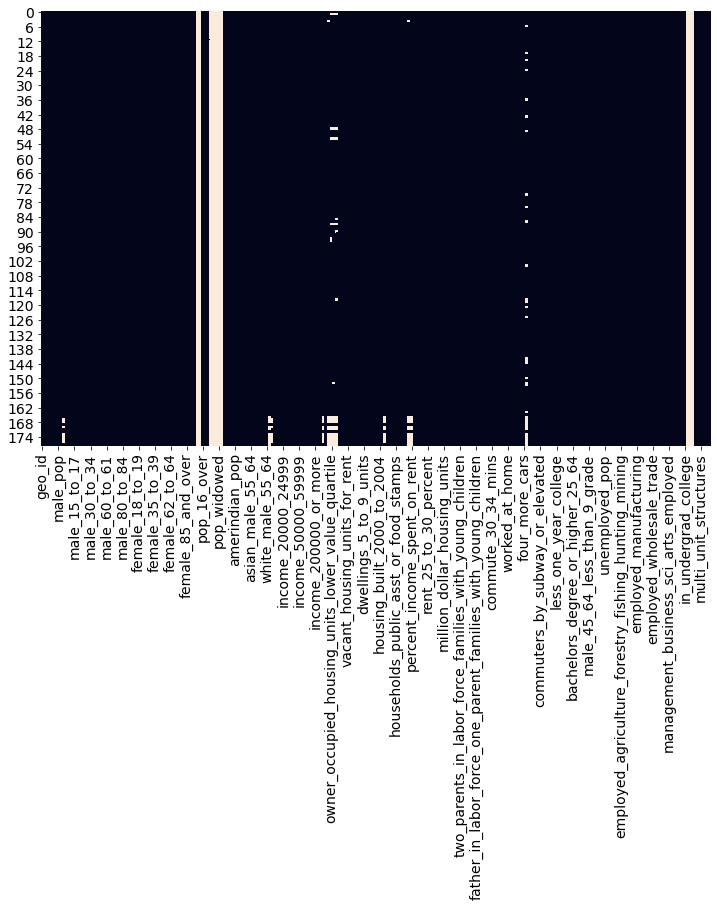

In [ ]:
sns.heatmap(df.isnull(), cbar=False)

In [ ]:
# The previous merger was meant to also be used for SVI-based variables, here, we remove the ordinal_value 

df.drop(['geo_id', 'do_date','city_name', 'ordinal_value'], axis=1, inplace=True)

### Normalisation for All ACS Variables, where applicable
[To add link for definition]

In [ ]:
# Population with Bachelors Degree or Higher, Ages 25 to 64
df['bachelors_degree_or_higher_25_64'] = df['bachelors_degree_or_higher_25_64'] / df['pop_25_64']

# The total number of minutes every worker in a geographic area over the age of 16 who did not work from home spent spent commuting to work in one day
df['aggregate_travel_time_to_work'] = df['aggregate_travel_time_to_work'] / (df['commuters_16_over']) # No data

# The number of workers age 16 years and over within a geographic area who primarily traveled to work by public transportation
df['commuters_by_public_transportation'] = df['commuters_by_public_transportation'] / (df['commuters_16_over'])

df['commuters_by_bus'] = df['commuters_by_bus'] / (df['commuters_16_over'])
df['commuters_by_car_truck_van'] = df['commuters_by_car_truck_van'] / (df['commuters_16_over'])
df['commuters_by_carpool'] = df['commuters_by_carpool'] / (df['commuters_16_over'])
df['commuters_by_subway_or_elevated'] = df['commuters_by_subway_or_elevated'] / (df['commuters_16_over'])
df['commuters_drove_alone'] = df['commuters_drove_alone'] / (df['commuters_16_over'])

# Men age 45 to 64 who obtained an associate's degree
df['male_45_64_associates_degree'] = df['male_45_64_associates_degree'] / df['male_45_to_64']
df['male_45_64_bachelors_degree'] =  df['male_45_64_bachelors_degree'] / df['male_45_to_64']
df['male_45_64_graduate_degree'] =   df['male_45_64_graduate_degree'] / df['male_45_to_64']
df['male_45_64_less_than_9_grade'] = df['male_45_64_less_than_9_grade'] / df['male_45_to_64']
df['male_45_64_grade_9_12'] =        df['male_45_64_grade_9_12'] / df['male_45_to_64']
df['male_45_64_high_school'] =       df['male_45_64_high_school'] / df['male_45_to_64']
df['male_45_64_some_college'] =      df['male_45_64_some_college'] / df['male_45_to_64']

df['male_45_to_64'] = df['male_45_to_64'] / df['total_pop']

df['asian_male_45_54'] = df['asian_male_45_54'] / (df['male_45_to_49'] + df['male_50_to_54'])
df['asian_male_55_64'] = df['asian_male_55_64'] / (df['male_55_to_59'] + df['male_60_to_61'] + df['male_62_to_64'])
df['black_male_45_54'] = df['black_male_45_54'] / (df['male_45_to_49'] + df['male_50_to_54'])
df['black_male_55_64'] = df['black_male_55_64'] / (df['male_55_to_59'] + df['male_60_to_61'] + df['male_62_to_64'])
df['hispanic_male_45_54'] = df['hispanic_male_45_54'] / (df['male_45_to_49'] + df['male_50_to_54'])
df['hispanic_male_55_64'] = df['hispanic_male_55_64'] / (df['male_55_to_59'] + df['male_60_to_61'] + df['male_62_to_64'])

df['white_male_45_54'] = df['white_male_45_54'] / (df['male_45_to_49'] + df['male_50_to_54'])
df['white_male_45_54'] = df['white_male_45_54'] / (df['male_55_to_59'] + df['male_60_to_61'] + df['male_62_to_64'])

df['male_pop'] = df['male_pop'] / df['total_pop']
df['female_pop'] = df['female_pop'] / df['total_pop']

df['male_under_5'] = df['male_under_5'] / df['total_pop']
df['male_5_to_9'] = df['male_5_to_9'] / df['total_pop']
df['male_10_to_14'] = df['male_10_to_14'] / df['total_pop']
df['male_15_to_17'] = df['male_15_to_17'] / df['total_pop']
df['male_18_to_19'] = df['male_18_to_19'] / df['total_pop']
df['male_20'] = df['male_20'] / df['total_pop']
df['male_21'] = df['male_21'] / df['total_pop']
df['male_22_to_24'] = df['male_22_to_24'] / df['total_pop']
df['male_25_to_29'] = df['male_25_to_29'] / df['total_pop']
df['male_30_to_34'] = df['male_30_to_34'] / df['total_pop']
df['male_35_to_39'] = df['male_35_to_39'] / df['total_pop']
df['male_40_to_44'] = df['male_40_to_44'] / df['total_pop']
df['male_45_to_49'] = df['male_45_to_49'] / df['total_pop']
df['male_50_to_54'] = df['male_50_to_54'] / df['total_pop']
df['male_55_to_59'] = df['male_55_to_59'] / df['total_pop']
df['male_60_to_61'] = df['male_60_to_61'] / df['total_pop']
df['male_62_to_64'] = df['male_62_to_64'] / df['total_pop']
df['male_65_to_66'] = df['male_65_to_66'] / df['total_pop']
df['male_67_to_69'] = df['male_67_to_69'] / df['total_pop']
df['male_70_to_74'] = df['male_70_to_74'] / df['total_pop']
df['male_75_to_79'] = df['male_75_to_79'] / df['total_pop']
df['male_80_to_84'] = df['male_80_to_84'] / df['total_pop']
df['male_85_and_over'] = df['male_85_and_over'] / df['total_pop']
df['female_under_5'] = df['female_under_5'] / df['total_pop']
df['female_5_to_9'] = df['female_5_to_9'] / df['total_pop']
df['female_10_to_14'] = df['female_10_to_14'] / df['total_pop']
df['female_15_to_17'] = df['female_15_to_17'] / df['total_pop']
df['female_18_to_19'] = df['female_18_to_19'] / df['total_pop']
df['female_20'] = df['female_20'] / df['total_pop']
df['female_21'] = df['female_21'] / df['total_pop']
df['female_22_to_24'] = df['female_22_to_24'] / df['total_pop']
df['female_25_to_29'] = df['female_25_to_29'] / df['total_pop']
df['female_30_to_34'] = df['female_30_to_34'] / df['total_pop']
df['female_35_to_39'] = df['female_35_to_39'] / df['total_pop']
df['female_40_to_44'] = df['female_40_to_44'] / df['total_pop']
df['female_45_to_49'] = df['female_45_to_49'] / df['total_pop']
df['female_50_to_54'] = df['female_50_to_54'] / df['total_pop']
df['female_55_to_59'] = df['female_55_to_59'] / df['total_pop']
df['female_60_to_61'] = df['female_60_to_61'] / df['total_pop']
df['female_62_to_64'] = df['female_62_to_64'] / df['total_pop']
df['female_65_to_66'] = df['female_65_to_66'] / df['total_pop']
df['female_67_to_69'] = df['female_67_to_69'] / df['total_pop']
df['female_70_to_74'] = df['female_70_to_74'] / df['total_pop']
df['female_75_to_79'] = df['female_75_to_79'] / df['total_pop']
df['female_80_to_84'] = df['female_80_to_84'] / df['total_pop']
df['female_85_and_over'] = df['female_85_and_over'] / df['total_pop']

# User-created Variable (as per team discussion on selection of variables based on the SVI concept)
df['non_white_pop'] = (df['total_pop'] - df['white_pop']) / df['total_pop']

# Non-white
df['white_pop'] = df['white_pop'] / df['total_pop']

df['population_1_year_and_over'] = df['population_1_year_and_over'] / df['total_pop']
df['population_3_years_over'] = df['population_3_years_over'] / df['total_pop']
df['pop_5_years_over'] = df['pop_5_years_over'] / df['total_pop']
df['pop_15_and_over'] = df['pop_15_and_over'] / df['total_pop']
df['pop_16_over'] = df['pop_16_over'] / df['total_pop']
df['pop_25_years_over'] = df['pop_25_years_over'] / df['total_pop']
df['pop_25_64'] = df['pop_25_64'] / df['total_pop']

# The number of people in a geographic area who have never been married
df['pop_never_married'] = df['pop_never_married'] / df['total_pop']

df['pop_now_married'] = df['pop_now_married'] / df['total_pop']
df['pop_separated'] = df['pop_separated'] / df['total_pop']
df['pop_widowed'] = df['pop_widowed'] / df['total_pop']
df['pop_divorced'] = df['pop_divorced'] / df['total_pop']

df['not_us_citizen_pop'] = df['not_us_citizen_pop'] / df['total_pop']

df['black_pop'] = df['black_pop'] / df['total_pop']
df['asian_pop'] = df['asian_pop'] / df['total_pop']
df['hispanic_pop'] = df['hispanic_pop'] / df['total_pop']
df['amerindian_pop'] = df['amerindian_pop'] / df['total_pop']
df['other_race_pop'] = df['other_race_pop'] / df['total_pop']
df['two_or_more_races_pop'] = df['two_or_more_races_pop'] / df['total_pop']
df['hispanic_any_race'] = df['hispanic_any_race'] / df['total_pop']
df['not_hispanic_pop'] = df['not_hispanic_pop'] / df['total_pop']

# The number of households in a geographic area whose annual income was less than $10,000
df['income_less_10000'] = df['income_less_10000'] / df['households']

df['income_10000_14999'] = df['income_10000_14999'] / df['households']
df['income_15000_19999'] = df['income_15000_19999'] / df['households']
df['income_20000_24999'] = df['income_20000_24999'] / df['households']
df['income_25000_29999'] = df['income_25000_29999'] / df['households']
df['income_30000_34999'] = df['income_30000_34999'] / df['households']
df['income_35000_39999'] = df['income_35000_39999'] / df['households']
df['income_40000_44999'] = df['income_40000_44999'] / df['households']
df['income_45000_49999'] = df['income_45000_49999'] / df['households']
df['income_50000_59999'] = df['income_50000_59999'] / df['households']
df['income_60000_74999'] = df['income_60000_74999'] / df['households']
df['income_75000_99999'] = df['income_75000_99999'] / df['households']
df['income_100000_124999'] = df['income_100000_124999'] / df['households']
df['income_125000_149999'] = df['income_125000_149999'] / df['households']
df['income_150000_199999'] = df['income_150000_199999'] / df['households']
df['income_200000_or_more'] = df['income_200000_or_more'] / df['households']

# The number of people in a geographic area who are part of a family (which could be just them as an individual) determined to be "in poverty" following the Office of Management and Budget's Directive 14
df['poverty'] = df['poverty'] / df['pop_determined_poverty_status']

# The number of people in each geography who could be identified as either living in poverty or not
df['pop_determined_poverty_status'] = df['pop_determined_poverty_status'] / df['total_pop']

# Renter-Occupied Housing Units Paying Cash Rent Median Gross Rent
df['renter_occupied_housing_units_paying_cash_median_gross_rent'] = df['renter_occupied_housing_units_paying_cash_median_gross_rent'] / df['housing_units_renter_occupied']

# Owner-Occupied Housing Units Lower Value Quartile
df['owner_occupied_housing_units_lower_value_quartile'] = df['owner_occupied_housing_units_lower_value_quartile'] / df['owner_occupied_housing_units']
df['owner_occupied_housing_units_median_value'] = df['owner_occupied_housing_units_median_value'] / df['owner_occupied_housing_units']
df['owner_occupied_housing_units_upper_value_quartile'] = df['owner_occupied_housing_units_upper_value_quartile'] / df['owner_occupied_housing_units']

# Normalised
df['occupied_housing_units'] = df['occupied_housing_units'] / df['housing_units']
df['housing_units_renter_occupied'] = df['housing_units_renter_occupied'] / df['housing_units']

df['vacant_housing_units_for_rent'] = df['vacant_housing_units_for_rent'] / df['vacant_housing_units']
df['vacant_housing_units_for_sale'] = df['vacant_housing_units_for_sale'] / df['vacant_housing_units']

# Normalised - not going to be used as the denominator for subsequent computation
df['vacant_housing_units'] = df['vacant_housing_units'] / df['housing_units']

df['dwellings_1_units_detached'] = df['dwellings_1_units_detached'] / df['housing_units']
df['dwellings_1_units_attached'] = df['dwellings_1_units_attached'] / df['housing_units']
df['dwellings_2_units'] = df['dwellings_2_units'] / df['housing_units']
df['dwellings_3_to_4_units'] = df['dwellings_3_to_4_units'] / df['housing_units']
df['dwellings_5_to_9_units'] = df['dwellings_5_to_9_units'] / df['housing_units']
df['dwellings_10_to_19_units'] = df['dwellings_10_to_19_units'] / df['housing_units']
df['dwellings_20_to_49_units'] = df['dwellings_20_to_49_units'] / df['housing_units']
df['dwellings_50_or_more_units'] = df['dwellings_50_or_more_units'] / df['housing_units']
df['mobile_homes'] = df['mobile_homes'] / df['housing_units']
df['housing_built_2005_or_later'] = df['housing_built_2005_or_later'] / df['housing_units']
df['housing_built_2000_to_2004'] = df['housing_built_2000_to_2004'] / df['housing_units']
df['housing_built_1939_or_earlier'] = df['housing_built_1939_or_earlier'] / df['housing_units']

df['married_households'] = df['married_households'] / df['households']
df['nonfamily_households'] = df['nonfamily_households'] / df['households']
df['family_households'] = df['family_households'] / df['households']
df['households_public_asst_or_food_stamps'] = df['households_public_asst_or_food_stamps'] / df['households']
df['male_male_households'] = df['male_male_households'] / df['households']
df['female_female_households'] = df['female_female_households'] / df['households']

df['children'] = df['children'] / df['total_pop']

# Children under 18 years of age in single female-led household
df['children_in_single_female_hh'] = df['children_in_single_female_hh'] / df['total_pop'] # No 'Single Female Household' is available for the denominator

# Housing units spending over 50% income on rent
df['rent_over_50_percent'] = df['rent_over_50_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_40_to_50_percent'] = df['rent_40_to_50_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_35_to_40_percent'] = df['rent_35_to_40_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_30_to_35_percent'] = df['rent_30_to_35_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_25_to_30_percent'] = df['rent_25_to_30_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_20_to_25_percent'] = df['rent_20_to_25_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_15_to_20_percent'] = df['rent_15_to_20_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_10_to_15_percent'] = df['rent_10_to_15_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])
df['rent_under_10_percent'] = df['rent_under_10_percent'] / (df['housing_units'] - df['rent_burden_not_computed'])

# Housing units without rent burden computed; Normalised - not going to be used as the denominator for subsequent computation
df['rent_burden_not_computed'] = df['rent_burden_not_computed'] / df['housing_units']

df['owner_occupied_housing_units'] = df['owner_occupied_housing_units'] / df['housing_units']
df['million_dollar_housing_units'] = df['million_dollar_housing_units'] / df['housing_units']
df['mortgaged_housing_units'] = df['mortgaged_housing_units'] / df['housing_units']

# A count of housing units in each geography. A housing unit is a house, an apartment, a mobile home or trailer, a group of rooms…
# Normalised - not going to be used as the denominator for subsequent computation
df['housing_units'] = df['housing_units'] / df['total_pop']

# Population living in group quarters
df['group_quarters'] = df['group_quarters'] / df['total_pop']
  
# All people in a geographic area who lived in a different city within the year prior to the survey 
df['different_house_year_ago_different_city'] = df['different_house_year_ago_different_city'] / df['total_pop'] # No data
df['different_house_year_ago_same_city'] = df['different_house_year_ago_same_city'] / df['total_pop'] # No data

df['families_with_young_children'] = df['families_with_young_children'] / df['family_households']
df['two_parent_families_with_young_children'] = df['two_parent_families_with_young_children'] / df['family_households']
df['two_parents_in_labor_force_families_with_young_children'] = df['two_parents_in_labor_force_families_with_young_children'] / df['family_households']
df['two_parents_father_in_labor_force_families_with_young_children'] = df['two_parents_father_in_labor_force_families_with_young_children'] / df['family_households']
df['two_parents_mother_in_labor_force_families_with_young_children'] = df['two_parents_mother_in_labor_force_families_with_young_children'] / df['family_households']
df['two_parents_not_in_labor_force_families_with_young_children'] = df['two_parents_not_in_labor_force_families_with_young_children'] / df['family_households']
df['one_parent_families_with_young_children'] = df['one_parent_families_with_young_children'] / df['family_households']
df['father_one_parent_families_with_young_children'] = df['father_one_parent_families_with_young_children'] / df['family_households']
df['father_in_labor_force_one_parent_families_with_young_children'] = df['father_in_labor_force_one_parent_families_with_young_children'] / df['family_households']

 
# The number of workers in a geographic area over the age of 16 who do not work from home and commute in less than 10 minutes
df['commute_less_10_mins'] = df['commute_less_10_mins'] / df['commuters_16_over']
df['commute_10_14_mins'] = df['commute_10_14_mins'] / df['commuters_16_over']
df['commute_15_19_mins'] = df['commute_15_19_mins'] / df['commuters_16_over']
df['commute_20_24_mins'] = df['commute_20_24_mins'] / df['commuters_16_over']
df['commute_25_29_mins'] = df['commute_25_29_mins'] / df['commuters_16_over']
df['commute_30_34_mins'] = df['commute_30_34_mins'] / df['commuters_16_over']
df['commute_35_44_mins'] = df['commute_35_44_mins'] / df['commuters_16_over']
df['commute_60_more_mins'] = df['commute_60_more_mins'] / df['commuters_16_over']
df['commute_45_59_mins'] = df['commute_45_59_mins'] / df['commuters_16_over']
df['commuters_16_over'] = df['commuters_16_over'] / df['commuters_16_over']
df['walked_to_work'] = df['walked_to_work'] / df['commuters_16_over']
df['worked_at_home'] = df['worked_at_home'] / df['commuters_16_over']

# All people in a geographic area over the age of 16 who do not own a car.
df['no_car'] = df['no_car'] / df['total_pop']

# Car-free households
df['no_cars'] = df['no_cars'] / df['households']

# One car households
df['one_car'] = df['one_car'] / df['households']

df['two_cars'] = df['two_cars'] / df['households']
df['three_cars'] = df['three_cars'] / df['households']
df['four_more_cars'] = df['four_more_cars'] / df['households']

#  The number of people in a geographic area over the age of 25 who obtained a associate's degree, and did not complete a more advanced degree
df['associates_degree'] = df['associates_degree'] / df['pop_25_years_over']
df['bachelors_degree'] = df['bachelors_degree'] / df['pop_25_years_over']
df['high_school_diploma'] = df['high_school_diploma'] / df['pop_25_years_over']
df['less_one_year_college'] = df['less_one_year_college'] / df['pop_25_years_over']
df['masters_degree'] = df['masters_degree'] / df['pop_25_years_over']
df['one_year_more_college'] = df['one_year_more_college'] / df['pop_25_years_over']
df['less_than_high_school_graduate'] = df['less_than_high_school_graduate'] / df['pop_25_years_over']
df['high_school_including_ged'] = df['high_school_including_ged'] / df['pop_25_years_over']
df['bachelors_degree_2'] = df['bachelors_degree_2'] / df['pop_25_years_over']
df['graduate_professional_degree'] = df['graduate_professional_degree'] / df['pop_25_years_over']
df['some_college_and_associates_degree'] = df['some_college_and_associates_degree'] / df['pop_25_years_over']

df['employed_pop'] = df['employed_pop'] / df['pop_in_labor_force']
df['unemployed_pop'] = df['unemployed_pop'] / df['pop_in_labor_force'] 

df['pop_in_labor_force'] = df['pop_in_labor_force'] / df['total_pop']
df['not_in_labor_force'] = df['not_in_labor_force'] / df['total_pop']

df['workers_16_and_over'] = df['workers_16_and_over'] / df['pop_16_over']

df['management_business_sci_arts_employed'] = df['management_business_sci_arts_employed'] / df['civilian_labor_force']
df['sales_office_employed'] = df['sales_office_employed'] / df['civilian_labor_force']

# The number of people in each geography who are members of the U.S. Armed Forces (people on active duty with the United States Army, Air Force, Navy, Marine Corps, or Coast Guard)
df['armed_forces'] = df['armed_forces'] / df['total_pop'] # Denominator is different from 'civilian_labor_force'

# The number of civilians 16 years and over in each geography who can be classified as either "employed" or "unemployed" below
df['civilian_labor_force'] = df['civilian_labor_force'] / df['pop_16_over'] # Denominator is different from 'armed_forces'

df['employed_agriculture_forestry_fishing_hunting_mining'] = df['employed_agriculture_forestry_fishing_hunting_mining'] / df['employed_pop']
df['employed_arts_entertainment_recreation_accommodation_food'] = df['employed_arts_entertainment_recreation_accommodation_food'] / df['employed_pop']
df['employed_construction'] = df['employed_construction'] / df['employed_pop']
df['employed_education_health_social'] = df['employed_education_health_social'] / df['employed_pop']
df['employed_finance_insurance_real_estate'] = df['employed_finance_insurance_real_estate'] / df['employed_pop']
df['employed_information'] = df['employed_information'] / df['employed_pop']
df['employed_manufacturing'] = df['employed_manufacturing'] / df['employed_pop']
df['employed_other_services_not_public_admin'] = df['employed_other_services_not_public_admin'] / df['employed_pop']
df['employed_public_administration'] = df['employed_public_administration'] / df['employed_pop']
df['employed_retail_trade'] = df['employed_retail_trade'] / df['employed_pop']
df['employed_science_management_admin_waste'] = df['employed_science_management_admin_waste'] / df['employed_pop']
df['employed_transportation_warehousing_utilities'] = df['employed_transportation_warehousing_utilities'] / df['employed_pop']
df['employed_wholesale_trade'] = df['employed_wholesale_trade'] / df['employed_pop']
df['occupation_management_arts'] = df['occupation_management_arts'] / df['employed_pop']
df['occupation_natural_resources_construction_maintenance'] = df['occupation_natural_resources_construction_maintenance'] / df['employed_pop']
df['occupation_production_transportation_material'] = df['occupation_production_transportation_material'] / df['employed_pop']
df['occupation_sales_office'] = df['occupation_sales_office'] / df['employed_pop']
df['occupation_services'] = df['occupation_services'] / df['employed_pop']

# Students Enrolled in Grades 1 to 4
df['in_grades_1_to_4'] = df['in_grades_1_to_4'] / df['in_school']
df['in_grades_5_to_8'] = df['in_grades_5_to_8'] / df['in_school']
df['in_grades_9_to_12'] = df['in_grades_9_to_12'] / df['in_school']

# The total number of people in each geography currently enrolled at any level of school, from nursery or pre-school to advanced post-graduate education. Only includes those over the age of 3.
df['in_school'] = df['in_school'] / df['total_pop']
df['in_undergrad_college'] = df['in_undergrad_college'] / df['in_school']

df['speak_only_english_at_home'] = df['speak_only_english_at_home'] / df['total_pop']
df['speak_spanish_at_home'] = df['speak_spanish_at_home'] / df['total_pop']
df['speak_spanish_at_home_low_english'] = df['speak_spanish_at_home_low_english'] / df['total_pop']


In [ ]:
df['white_pop'].head()

0    0.913780
1    0.177391
2    0.525230
3    0.298165
4    0.478322
Name: white_pop, dtype: float64

In [ ]:
df.isnull().sum().sort_values(ascending=False).head(25)

pop_divorced                                                   178
pop_widowed                                                    178
pop_now_married                                                178
pop_never_married                                              178
pop_15_and_over                                                178
pop_5_years_over                                               178
pop_separated                                                  178
speak_only_english_at_home                                     178
speak_spanish_at_home                                          178
speak_spanish_at_home_low_english                              178
aggregate_travel_time_to_work                                   33
owner_occupied_housing_units_upper_value_quartile               17
owner_occupied_housing_units_lower_value_quartile               16
owner_occupied_housing_units_median_value                       15
vacant_housing_units_for_rent                                 

In [ ]:
df.dropna(axis=1, thresh=33, inplace=True)

In [ ]:
df.isnull().sum().sort_values(ascending=False).head(15)

aggregate_travel_time_to_work                                  33
owner_occupied_housing_units_upper_value_quartile              17
owner_occupied_housing_units_lower_value_quartile              16
owner_occupied_housing_units_median_value                      15
vacant_housing_units_for_sale                                  11
median_rent                                                    11
renter_occupied_housing_units_paying_cash_median_gross_rent    11
vacant_housing_units_for_rent                                  11
percent_income_spent_on_rent                                   10
median_income                                                  10
dwellings_1_units_detached                                      9
dwellings_1_units_attached                                      9
vacant_housing_units                                            9
dwellings_2_units                                               9
housing_units_renter_occupied                                   9
dtype: int

In [ ]:
df.head()

,redline_index,total_pop,households,male_pop,female_pop,median_age,male_under_5,male_5_to_9,male_10_to_14,male_15_to_17,...,in_grades_5_to_8,in_grades_9_to_12,in_school,in_undergrad_college,aged_65_or_older,aged_17_or_younger,multi_unit_structures,non_white,reweighted_redline_index,non_white_pop
0,100,4071,2005,0.533775,0.466225,31.4,0.033161,0.019897,0.002948,0.017440,...,0.030303,0.205628,0.113486,757.805195,196,476,1497,351,3.792748,0.086220
1,100,2300,1094,0.397391,0.602609,29.4,0.029565,0.041304,0.058261,0.037826,...,0.251214,0.151699,0.358261,354.490291,173,751,989,1892,3.996286,0.822609
2,100,7075,3493,0.499505,0.500495,31.7,0.022332,0.015689,0.006784,0.004099,...,0.043197,0.000000,0.327208,4205.269978,819,536,4490,3359,4.000000,0.474770
3,100,2398,1136,0.482485,0.517515,39.4,0.000000,0.019183,0.015430,0.010425,...,0.086356,0.115717,0.241451,1002.272884,465,230,1237,1683,4.000000,0.701835
4,100,4290,2185,0.488345,0.511655,37.0,0.021911,0.038462,0.000000,0.000000,...,0.000000,0.000000,0.141725,345.740132,485,489,2133,2238,4.000000,0.521678


In [ ]:
df['reweighted_redline_index'].head()

0    3.792748
1    3.996286
2    4.000000
3    4.000000
4    4.000000
Name: reweighted_redline_index, dtype: float64

In [ ]:
df

,redline_index,total_pop,households,male_pop,female_pop,median_age,male_under_5,male_5_to_9,male_10_to_14,male_15_to_17,...,in_grades_5_to_8,in_grades_9_to_12,in_school,in_undergrad_college,aged_65_or_older,aged_17_or_younger,multi_unit_structures,non_white,reweighted_redline_index,non_white_pop
0,100,4071,2005,0.533775,0.466225,31.4,0.033161,0.019897,0.002948,0.017440,...,0.030303,0.205628,0.113486,757.805195,196,476,1497,351,3.792748,0.086220
1,100,2300,1094,0.397391,0.602609,29.4,0.029565,0.041304,0.058261,0.037826,...,0.251214,0.151699,0.358261,354.490291,173,751,989,1892,3.996286,0.822609
2,100,7075,3493,0.499505,0.500495,31.7,0.022332,0.015689,0.006784,0.004099,...,0.043197,0.000000,0.327208,4205.269978,819,536,4490,3359,4.000000,0.474770
3,100,2398,1136,0.482485,0.517515,39.4,0.000000,0.019183,0.015430,0.010425,...,0.086356,0.115717,0.241451,1002.272884,465,230,1237,1683,4.000000,0.701835
4,100,4290,2185,0.488345,0.511655,37.0,0.021911,0.038462,0.000000,0.000000,...,0.000000,0.000000,0.141725,345.740132,485,489,2133,2238,4.000000,0.521678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,75,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,3.000000,NaN
174,75,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,2.505072,NaN
175,75,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,3.000000,NaN
176,50,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,0,0,0,2.000000,NaN


In [ ]:
# Remove all rows with any null values; prior to this, the columns with all-null values have been removed
df.dropna(inplace=True)

# Set 'reweighted_redline_index' as target variable
Y = df['reweighted_redline_index']

# Set the remaining variables as independent variables
X = df.drop(['reweighted_redline_index'], axis=1)


In [ ]:
X.head()

,redline_index,total_pop,households,male_pop,female_pop,median_age,male_under_5,male_5_to_9,male_10_to_14,male_15_to_17,...,in_grades_1_to_4,in_grades_5_to_8,in_grades_9_to_12,in_school,in_undergrad_college,aged_65_or_older,aged_17_or_younger,multi_unit_structures,non_white,non_white_pop
0,100,4071,2005,0.533775,0.466225,31.4,0.033161,0.019897,0.002948,0.017440,...,0.099567,0.030303,0.205628,0.113486,757.805195,196,476,1497,351,0.086220
2,100,7075,3493,0.499505,0.500495,31.7,0.022332,0.015689,0.006784,0.004099,...,0.058747,0.043197,0.000000,0.327208,4205.269978,819,536,4490,3359,0.474770
3,100,2398,1136,0.482485,0.517515,39.4,0.000000,0.019183,0.015430,0.010425,...,0.129534,0.086356,0.115717,0.241451,1002.272884,465,230,1237,1683,0.701835
5,100,3734,1543,0.535083,0.464917,36.4,0.050080,0.034815,0.032941,0.003482,...,0.274713,0.211494,0.127586,0.232994,665.252874,616,737,1458,2336,0.625603
7,100,4126,917,0.452254,0.547746,20.6,0.018177,0.023994,0.012603,0.002908,...,0.029341,0.037280,0.022437,0.702133,3513.580255,210,392,928,2590,0.627727


In [ ]:
colnames = X.columns

### This section is for team's review [16 Feb 2021] - Errors in Poisson Regression

In [ ]:
ranks = {}
def ranking(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x,2), ranks)
    return dict(zip(names, ranks))

In [ ]:
# Using Poisson Regression

ps_r = PoissonRegressor()
ps_r.fit(X,Y)
ranks["PoissonRegressor"] = ranking(np.abs(ps_r.coef_), colnames)

overflow encountered in exp
overflow encountered in exp
divide by zero encountered in true_divide
invalid value encountered in true_divide
invalid value encountered in multiply
divide by zero encountered in true_divide
invalid value encountered in add


AttributeError: 'str' object has no attribute 'decode'

In [ ]:
# Using Recursive Feature Elimination
# This is KIV-ed, pending Poisson Regression

lr = LinearRegression(normalize=True) # To replace with Poisson Regression
lr.fit(X,Y)
rfe = RFE(lr, n_features_to_select=10, step=1, verbose=3)
rfe = rfe.fit(X,Y)

ranks["RFE"] = ranking(list(map(float, rfe.ranking_)), colnames, order=-1)

Fitting estimator with 236 features.
Fitting estimator with 235 features.
Fitting estimator with 234 features.
Fitting estimator with 233 features.
Fitting estimator with 232 features.
Fitting estimator with 231 features.
Fitting estimator with 230 features.
Fitting estimator with 229 features.
Fitting estimator with 228 features.
Fitting estimator with 227 features.
Fitting estimator with 226 features.
Fitting estimator with 225 features.
Fitting estimator with 224 features.
Fitting estimator with 223 features.
Fitting estimator with 222 features.
Fitting estimator with 221 features.
Fitting estimator with 220 features.
Fitting estimator with 219 features.
Fitting estimator with 218 features.
Fitting estimator with 217 features.
Fitting estimator with 216 features.
Fitting estimator with 215 features.
Fitting estimator with 214 features.
Fitting estimator with 213 features.
Fitting estimator with 212 features.
Fitting estimator with 211 features.
Fitting estimator with 210 features.
F

In [ ]:
# Using Random Forest
rf = RandomForestRegressor(n_jobs=-1, n_estimators=100, verbose=3)
rf.fit(X,Y)
ranks["RF"] = ranking(rf.feature_importances_, colnames)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
building tree 1 of 100building tree 2 of 100

building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100building tree 25 of 100

building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100building tree 35 of 100

building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39

In [ ]:
r = {}
for name in colnames:
    r[name] = round(np.mean([ranks[method][name] 
                             for method in ranks.keys()]), 2)
 
methods = sorted(ranks.keys())
ranks["Mean"] = r
methods.append("Mean")
 
print("\t\t\t%s" % "\t".join(methods))
for name in colnames:
    print("%s\t\t%s" % (name, "\t".join(map(str, 
                         [ranks[method][name] for method in methods]))))

			RF	RFE	Mean
redline_index		1.0	0.31	0.66
total_pop		0.0	0.03	0.02
households		0.0	0.09	0.04
male_pop		0.0	0.35	0.18
female_pop		0.0	0.28	0.14
median_age		0.01	0.31	0.16
male_under_5		0.0	0.5	0.25
male_5_to_9		0.0	0.87	0.44
male_10_to_14		0.0	0.4	0.2
male_15_to_17		0.0	0.96	0.48
male_18_to_19		0.0	0.5	0.25
male_20		0.0	0.91	0.46
male_21		0.0	0.84	0.42
male_22_to_24		0.0	0.44	0.22
male_25_to_29		0.01	0.83	0.42
male_30_to_34		0.0	0.85	0.42
male_35_to_39		0.0	0.64	0.32
male_40_to_44		0.01	0.42	0.22
male_45_to_49		0.0	0.89	0.44
male_50_to_54		0.0	0.59	0.3
male_55_to_59		0.01	1.0	0.5
male_60_to_61		0.01	0.89	0.45
male_62_to_64		0.0	0.76	0.38
male_65_to_66		0.0	0.92	0.46
male_67_to_69		0.01	0.59	0.3
male_70_to_74		0.0	0.61	0.3
male_75_to_79		0.0	0.99	0.5
male_80_to_84		0.0	0.9	0.45
male_85_and_over		0.0	0.95	0.48
female_under_5		0.0	0.71	0.36
female_5_to_9		0.0	0.92	0.46
female_10_to_14		0.0	0.99	0.5
female_15_to_17		0.0	1.0	0.5
female_18_to_19		0.0	0.46	0.23
female_20		0.0	0.55	0.28
femal

In [ ]:
meanplot = pd.DataFrame(list(r.items()), columns= ['Feature','Mean Ranking'])
meanplot = meanplot.sort_values('Mean Ranking', ascending=False)

In [ ]:
meanplot.head(50)

,Feature,Mean Ranking
0,redline_index,0.66
161,commute_45_59_mins,0.51
50,female_80_to_84,0.50
49,female_75_to_79,0.50
46,female_65_to_66,0.50
114,mobile_homes,0.50
124,female_female_households,0.50
134,rent_25_to_30_percent,0.50
32,female_15_to_17,0.50
73,white_male_45_54,0.50


In [ ]:
df_plot = meanplot.iloc[:50,:]

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
The `size` parameter has been renamed to `height`; please update your code.


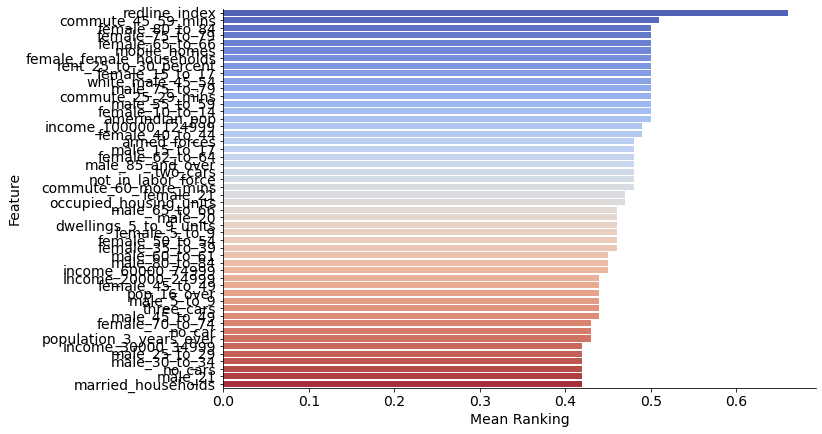

In [ ]:
sns.factorplot(x="Mean Ranking", y="Feature", data = df_plot, kind="bar", 
               size=6, aspect=1.9, palette='coolwarm')

### End of section for team's view

In [ ]:
#####

### Next section is for DR Landry's review [15 Feb 2021] - Random Forest-only approach to feature importance ranking

https://mljar.com/blog/feature-importance-in-random-forest/

In [ ]:
rf = RandomForestRegressor(n_estimators=100)
rf.fit(X, Y)

RandomForestRegressor()

Text(0.5, 0, 'Random Forest Feature Importance')

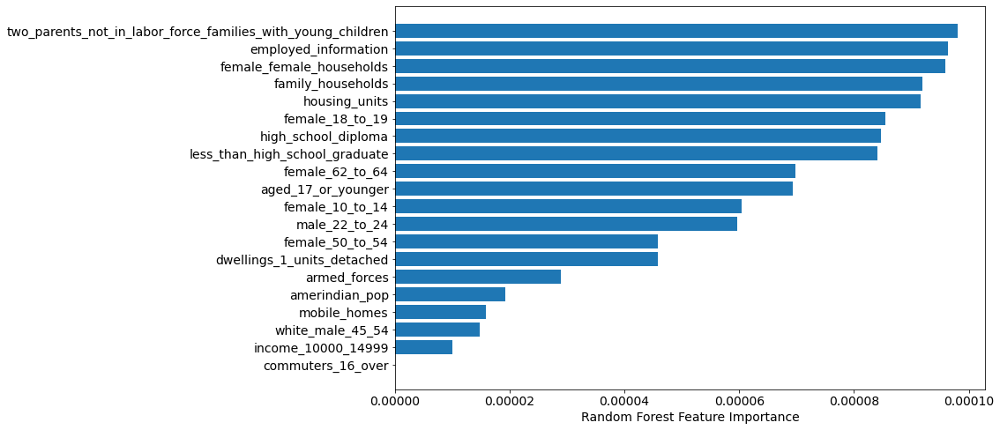

In [ ]:
sorted_idx = rf.feature_importances_.argsort()[:20]
plt.barh(X.columns[sorted_idx], rf.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

In [ ]:
perm_importance = permutation_importance(rf, X, Y)

Text(0.5, 0, 'Permutation Importance')

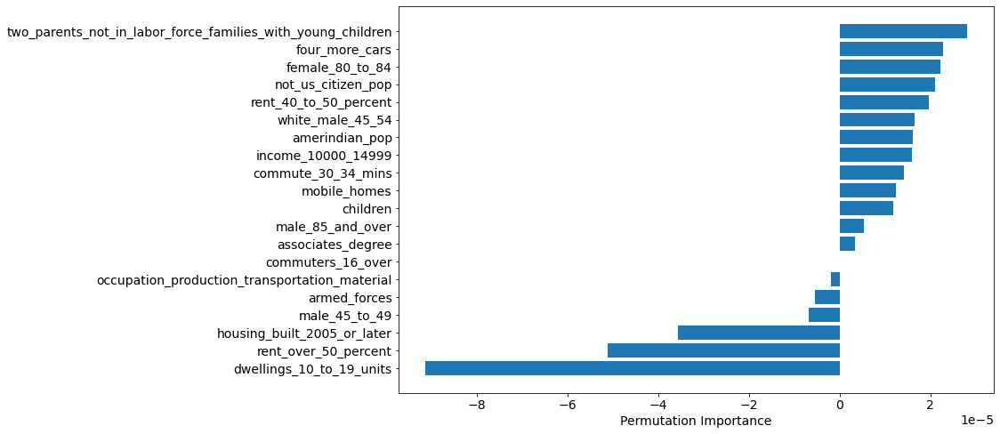

In [ ]:
sorted_idx = perm_importance.importances_mean.argsort()[0:20]
plt.barh(X.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [ ]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X)

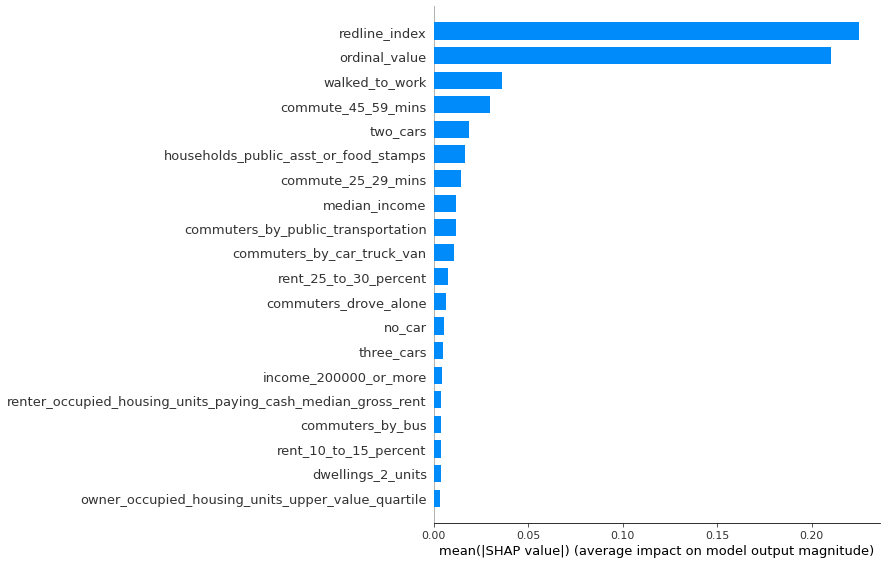

In [ ]:
shap.summary_plot(shap_values, X, plot_type="bar")

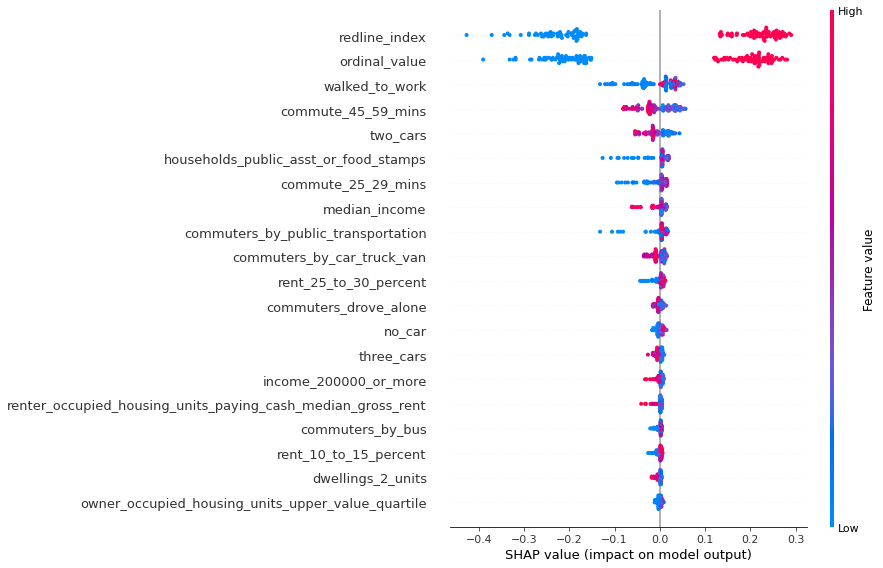

In [ ]:
shap.summary_plot(shap_values, X)

### End of review section

In [ ]:
ranks = {}
def ranking(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x,2), ranks)
    return dict(zip(names, ranks))

In [ ]:
# Using Poisson Regression
# n_samples = df_train.shape[0]

poisson_glm = Pipeline([
    ("preprocessor", linear_model_preprocessor),
    ("regressor", PoissonRegressor(alpha=1e-12, max_iter=300))
])
poisson_glm.fit(df_train, df_train["Frequency"],
                regressor__sample_weight=df_train["Exposure"])

ps_r = PoissonRegressor()
ps_r.fit(X,Y)
ranks["PoissonRegressor"] = ranking(np.abs(ps_r.coef_), colnames)



/home/jovyan/venv/lib/python3.7/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/home/jovyan/venv/lib/python3.7/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/home/jovyan/venv/lib/python3.7/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/home/jovyan/venv/lib/python3.7/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/home/jovyan/venv/lib/python3.7/site-packages/sklearn/linear_model/_glm/glm.py:43: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/home/jovyan/venv/lib/python3.7/site-packages/sklearn/_loss/glm_distribution.py:315: RuntimeWarni

AttributeError: 'str' object has no attribute 'decode'

In [ ]:
X.dtypes

redline_index              int64
total_pop                  int64
households                 int64
male_pop                 float64
female_pop               float64
                          ...   
aged_17_or_younger         int64
multi_unit_structures      int64
non_white                  int64
ordinal_value              int64
non_white_pop            float64
Length: 237, dtype: object

In [ ]:
# Using Recursive Feature Elimination
from sklearn.svm import SVR
estimator = SVR(kernel="linear")
rfe = RFE(estimator, n_features_to_select=10, step=1, verbose=3)
rfe = rfe.fit(X,Y)

ranks["RFE"] = ranking(list(map(float, rfe.ranking_)), colnames, order=-1)

Fitting estimator with 237 features.


KeyboardInterrupt: 

In [ ]:
# Using Random Forest
rf = RandomForestRegressor(n_jobs=-1, n_estimators=100, verbose=3)
rf.fit(X,Y)
ranks["RF"] = ranking(rf.feature_importances_, colnames)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    0.2s
building tree 1 of 100building tree 2 of 100

building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100building tree 16 of 100

building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100building tree 30 of 100

building tree 31 of 100building tree 32 of 100

building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
bu

In [ ]:
r = {}
for name in colnames:
    r[name] = round(np.mean([ranks[method][name] 
                             for method in ranks.keys()]), 2)
 
methods = sorted(ranks.keys())
ranks["Mean"] = r
methods.append("Mean")
 
print("\t\t\t%s" % "\t".join(methods))
for name in colnames:
    print("%s\t\t%s" % (name, "\t".join(map(str, 
                         [ranks[method][name] for method in methods]))))

			Mean	RF	RFE	Mean
redline_index		0.59	0.97	0.27	0.59
total_pop		0.02	0.0	0.04	0.02
households		0.06	0.0	0.11	0.06
male_pop		0.5	0.0	1.0	0.5
female_pop		0.5	0.01	1.0	0.5
median_age		0.15	0.0	0.3	0.15
male_under_5		0.48	0.0	0.96	0.48
male_5_to_9		0.48	0.0	0.97	0.48
male_10_to_14		0.5	0.0	1.0	0.5
male_15_to_17		0.5	0.0	1.0	0.5
male_18_to_19		0.49	0.0	0.98	0.49
male_20		0.5	0.0	1.0	0.5
male_21		0.48	0.0	0.95	0.48
male_22_to_24		0.48	0.0	0.96	0.48
male_25_to_29		0.5	0.01	1.0	0.5
male_30_to_34		0.48	0.01	0.96	0.48
male_35_to_39		0.5	0.01	0.99	0.5
male_40_to_44		0.5	0.0	1.0	0.5
male_45_to_49		0.42	0.0	0.83	0.42
male_50_to_54		0.34	0.0	0.67	0.34
male_55_to_59		0.16	0.01	0.31	0.16
male_60_to_61		0.43	0.02	0.85	0.43
male_62_to_64		0.36	0.01	0.7	0.36
male_65_to_66		0.5	0.0	1.0	0.5
male_67_to_69		0.5	0.0	1.0	0.5
male_70_to_74		0.5	0.0	0.99	0.5
male_75_to_79		0.48	0.0	0.97	0.48
male_80_to_84		0.49	0.01	0.98	0.49
male_85_and_over		0.5	0.0	1.0	0.5
female_under_5		0.37	0.0	0.74	0.37
female_5_to_9		0

In [ ]:
 meanplot = pd.DataFrame(list(r.items()), columns= ['Feature','Mean Ranking'])
meanplot = meanplot.sort_values('Mean Ranking', ascending=False)

In [ ]:
meanplot.head(50)

,Feature,Mean Ranking
235,ordinal_value,1.00
0,redline_index,0.95
163,walked_to_work,0.14
161,commute_45_59_mins,0.10
172,commuters_by_public_transportation,0.06
165,no_car,0.06
122,households_public_asst_or_food_stamps,0.05
168,two_cars,0.04
97,renter_occupied_housing_units_paying_cash_medi...,0.04
177,commuters_drove_alone,0.03


In [ ]:
df_plot = meanplot.iloc[:20,:]

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/categorical.py:3720: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


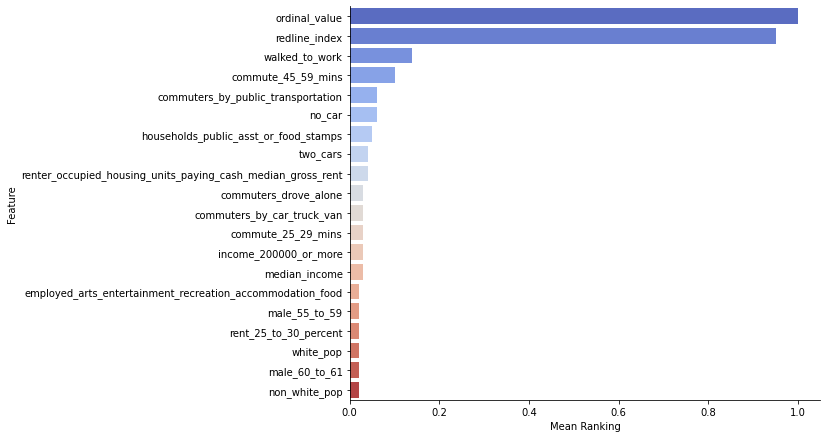

In [ ]:
sns.factorplot(x="Mean Ranking", y="Feature", data = df_plot, kind="bar", 
               size=6, aspect=1.9, palette='coolwarm')

In [ ]:
# Define a set variables selected based on SVI, for the purpose of data cleaning

SVI_Vars = ['reweighted_redline_index','poverty','unemployed_pop','median_income','income_per_capita','less_than_high_school_graduate',
'aged_65_or_older','aged_17_or_younger','one_parent_families_with_young_children',
'non_white',
'multi_unit_structures','mobile_homes','no_cars','group_quarters',
'pop_determined_poverty_status','total_pop','households','housing_units']

In [ ]:
# Remove duplicates and tracts with null values

df_Boston = df.copy() # Save a copy of the full Boston ACS dataset #Use copy to 
df = df_Boston[SVI_Vars]
df.head()

,reweighted_redline_index,poverty,unemployed_pop,median_income,income_per_capita,less_than_high_school_graduate,aged_65_or_older,aged_17_or_younger,one_parent_families_with_young_children,non_white,multi_unit_structures,mobile_homes,no_cars,group_quarters,pop_determined_poverty_status,total_pop,households,housing_units
0,3.792748,135.0,101.0,132750.0,80548.0,90.0,196,476,0.0,351,233,0,394.0,0,4071.0,4071,2005,2154
1,3.996286,1304.0,212.0,12759.0,11501.0,473.0,173,751,218.0,1892,249,0,684.0,0,2300.0,2300,1094,1164
2,4.000000,1292.0,309.0,84083.0,85562.0,656.0,819,536,0.0,3359,4257,0,2040.0,1175,6037.0,7075,3493,4585
3,4.000000,752.0,96.0,28851.0,35524.0,482.0,465,230,12.0,1683,922,0,535.0,113,2303.0,2398,1136,1273
4,4.000000,1150.0,151.0,52676.0,53710.0,415.0,485,489,97.0,2238,1323,11,973.0,351,4199.0,4290,2185,2272


In [ ]:
# Remove duplicates and null values from the SVI-based variables dataset before further processing

df.drop_duplicates(inplace=True)
df.dropna(inplace=True)

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


### Sample size = 168

In [ ]:
df.count()

reweighted_redline_index                   168
poverty                                    168
unemployed_pop                             168
median_income                              168
income_per_capita                          168
less_than_high_school_graduate             168
aged_65_or_older                           168
aged_17_or_younger                         168
one_parent_families_with_young_children    168
non_white                                  168
multi_unit_structures                      168
mobile_homes                               168
no_cars                                    168
group_quarters                             168
pop_determined_poverty_status              168
total_pop                                  168
households                                 168
housing_units                              168
dtype: int64

In [ ]:
# Aggregating variables and normalising them
# Setting flags for the tracts which are ranked at 90th percentile and above

df['poverty_perc'] = df['poverty']/df_Boston['pop_determined_poverty_status']
df['poverty_perc_bin'] = df['poverty_perc'].apply(perc_bin)
df.loc[df['poverty_perc'] >= df['poverty_perc'].quantile(0.9), 'poverty_flag'] = 1
df['poverty_flag'] = df['poverty_flag'].fillna(0)

df['unemployed_pop_perc'] = df['unemployed_pop'] / df['total_pop']
df['unemployed_pop_perc_bin'] = df['unemployed_pop_perc'].apply(perc_bin)
df.loc[df['unemployed_pop_perc'] >= df['unemployed_pop_perc'].quantile(0.9), 'unemployed_flag'] = 1
df['unemployed_flag'] = df['unemployed_flag'].fillna(0)

df['less_than_high_school_graduate_perc'] = df['less_than_high_school_graduate'] / df['total_pop']
df['less_than_high_school_graduate_perc_bin'] = df['less_than_high_school_graduate_perc'].apply(perc_bin)
df.loc[df['less_than_high_school_graduate_perc'] >= df['less_than_high_school_graduate_perc'].quantile(0.9), 'less_than_high_school_graduate_flag'] = 1
df['less_than_high_school_graduate_flag'] = df['less_than_high_school_graduate_flag'].fillna(0)

df['aged_65_or_older_perc'] = df['aged_65_or_older'] / df['total_pop']
df['aged_65_or_older_perc_bin'] = df['aged_65_or_older_perc'].apply(perc_bin)
df.loc[df['aged_65_or_older_perc'] >= df['aged_65_or_older_perc'].quantile(0.9), 'aged_65_or_older_flag'] = 1
df['aged_65_or_older_flag'] = df['aged_65_or_older_flag'].fillna(0)

df['aged_17_or_younger_perc'] = df['aged_17_or_younger'] / df['total_pop']
df['aged_17_or_younger_perc_bin'] = df['aged_17_or_younger_perc'].apply(perc_bin)
df.loc[df['aged_17_or_younger_perc'] >= df['aged_17_or_younger_perc'].quantile(0.9), 'aged_17_or_younger_flag'] = 1
df['aged_17_or_younger_flag'] = df['aged_17_or_younger_flag'].fillna(0)

df['one_parent_families_with_young_children_perc'] = df['one_parent_families_with_young_children'] / df['households']
df['one_parent_families_with_young_children_perc_bin'] = df['one_parent_families_with_young_children_perc'].apply(perc_bin)
df.loc[df['one_parent_families_with_young_children_perc'] >= df['one_parent_families_with_young_children_perc'].quantile(0.9), 'one_parent_families_with_young_children_flag'] = 1
df['one_parent_families_with_young_children_flag'] = df['one_parent_families_with_young_children_flag'].fillna(0)

df['non_white_perc'] = df['non_white'] / df['total_pop']
df['non_white_perc_bin'] = df['non_white_perc'].apply(perc_bin)
df.loc[df['non_white_perc'] >= df['non_white_perc'].quantile(0.9), 'non_white_flag'] = 1
df['non_white_flag'] = df['non_white_flag'].fillna(0)

df['multi_unit_structures_perc'] = df['multi_unit_structures'] / df['housing_units']
df['multi_unit_structures_perc_bin'] = df['multi_unit_structures_perc'].apply(perc_bin)
df.loc[df['multi_unit_structures_perc'] >= df['multi_unit_structures_perc'].quantile(0.9), 'multi_unit_structures_flag'] = 1
df['multi_unit_structures_flag'] = df['multi_unit_structures_flag'].fillna(0)

df['mobile_homes_perc'] = df['mobile_homes'] / df['housing_units']
df['mobile_homes_perc_bin'] = df['mobile_homes_perc'].apply(perc_bin)
df.loc[df['mobile_homes_perc'] >= df['mobile_homes_perc'].quantile(0.9), 'mobile_homes_flag'] = 1
df['mobile_homes_flag'] = df['mobile_homes_flag'].fillna(0)

df['no_cars_perc'] = df['no_cars'] / df['households']
df['no_cars_perc_bin'] = df['no_cars_perc'].apply(perc_bin)
df.loc[df['no_cars_perc'] >= df['no_cars_perc'].quantile(0.9), 'no_cars_flag'] = 1
df['no_cars_flag'] = df['no_cars_flag'].fillna(0)

df['group_quarters_perc'] = df['group_quarters'] / df['total_pop']
df['group_quarters_perc_bin'] = df['group_quarters_perc'].apply(perc_bin)
df.loc[df['group_quarters_perc'] >= df['group_quarters_perc'].quantile(0.9), 'group_quarters_flag'] = 1
df['group_quarters_flag'] = df['group_quarters_flag'].fillna(0)

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

In [ ]:
# Repeat flag setting for variables which do not requirea normalisation
# Setting flags for the tracts which are ranked at 90th percentile and above

df.loc[df['median_income'] >= df['median_income'].quantile(0.9), 'median_income_flag'] = 1
df['median_income_flag'] = df['median_income_flag'].fillna(0)

df.loc[df['income_per_capita'] >= df['income_per_capita'].quantile(0.9), 'income_per_capita_flag'] = 1
df['income_per_capita_flag'] = df['income_per_capita_flag'].fillna(0)

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

### Create 5 New Features, i.e. a count of flags for all SVI-based variables, and for each of the 4 themes

In [ ]:
# The number of flags (for each tract), all SVI-based variables
df['SVI'] = df['poverty_flag'] + df['unemployed_flag'] + df['median_income_flag'] + df['income_per_capita_flag'] + df['less_than_high_school_graduate_flag'] + df['aged_65_or_older_flag'] + df['aged_17_or_younger_flag'] + df['one_parent_families_with_young_children_flag'] + df['non_white_flag'] + df['multi_unit_structures_flag'] + df['mobile_homes_flag'] + df['no_cars_flag'] + df['group_quarters_flag']

# The number of flags (for each tract); Theme#1: Socioeconomic Status
df['SVI_1'] = df['poverty_flag'] + df['unemployed_flag'] + df['median_income_flag'] + df['income_per_capita_flag'] + df['less_than_high_school_graduate_flag']

# The number of flags (for each tract); Theme#2: Household Composition & Disability
df['SVI_2'] = df['aged_65_or_older_flag'] + df['aged_17_or_younger_flag'] + df['one_parent_families_with_young_children_flag']

# The number of flags (for each tract); Theme#3: Minority Status & Language
df['SVI_3'] = df['non_white_flag']

# The number of flags (for each tract); Theme#4: Housing Type & Transportation
df['SVI_4'] = df['multi_unit_structures_flag'] + df['mobile_homes_flag'] + df['no_cars_flag'] + df['group_quarters_flag']

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

### Create new dataframes for the following analyses:
(a) 1 for Redline Index and All SVI-based ACS variables and
(b) 1 for Redline Index and 4 groups of ACS variables, i.e. Themes 1~4

In [ ]:
#Preserve Boston Geodataframe
gdf_Boston = df_Boston.copy()
gdf_Boston.head()

,geo_id,city_name,redline_index,do_date,total_pop,households,male_pop,female_pop,median_age,male_under_5,...,in_undergrad_college,speak_only_english_at_home,speak_spanish_at_home,speak_spanish_at_home_low_english,aged_65_or_older,aged_17_or_younger,multi_unit_structures,non_white,reweighted_redline_index,ordinal_value
0,2.502506e+10,Boston,100,2014-01-01,4071,2005,2173,1898,31.4,135,...,86,NaN,NaN,NaN,196,476,233,351,3.792748,4
1,2.502506e+10,Boston,100,2014-01-01,2300,1094,914,1386,29.4,68,...,127,NaN,NaN,NaN,173,751,249,1892,3.996286,4
2,2.502507e+10,Boston,100,2014-01-01,7075,3493,3534,3541,31.7,158,...,1376,NaN,NaN,NaN,819,536,4257,3359,4.000000,4
3,2.502507e+10,Boston,100,2014-01-01,2398,1136,1157,1241,39.4,0,...,242,NaN,NaN,NaN,465,230,922,1683,4.000000,4
4,2.502507e+10,Boston,100,2014-01-01,4290,2185,2095,2195,37.0,94,...,49,NaN,NaN,NaN,485,489,1323,2238,4.000000,4


#### Redline Index and All SVI-based ACS variables

In [ ]:
df_Boston = df # Preserve the original dataset as df_Boston
df = df_Boston[['reweighted_redline_index','poverty_perc_bin','unemployed_pop_perc_bin','median_income', 'income_per_capita','less_than_high_school_graduate_perc_bin','aged_65_or_older_perc_bin','aged_17_or_younger_perc_bin','one_parent_families_with_young_children_perc_bin','non_white_perc_bin','multi_unit_structures_perc_bin','mobile_homes_perc_bin','no_cars_perc_bin','group_quarters_perc_bin','SVI','SVI_1','SVI_2','SVI_3','SVI_4']]
df_corr = df_Boston[['reweighted_redline_index','poverty_perc','unemployed_pop_perc','median_income', 'income_per_capita','less_than_high_school_graduate_perc','aged_65_or_older_perc','aged_17_or_younger_perc','one_parent_families_with_young_children_perc','non_white_perc','multi_unit_structures_perc','mobile_homes_perc','no_cars_perc','group_quarters_perc','SVI','SVI_1','SVI_2','SVI_3','SVI_4']]

#### Subgrouping: Redline Index and 4 Themes of SVI-based variables

In [ ]:
# Redlining and ses - ACS variables selected based on Socioeconomic Status
df_ses = df_Boston[['reweighted_redline_index','poverty_perc_bin','unemployed_pop_perc_bin','median_income', 'income_per_capita','less_than_high_school_graduate_perc_bin']]

# Redlining and household composition - ACS variables selected based on SVI Household Composition & Disability
df_hh_composition_disability = df_Boston[['reweighted_redline_index','aged_65_or_older_perc_bin','aged_17_or_younger_perc_bin','one_parent_families_with_young_children_perc_bin']]

# Redlining and percentage of non-white population - ACS variables selected based on SVI Minority Status & Language
df_minority_status = df_Boston[['reweighted_redline_index','non_white_perc_bin']]

# Redlining and housing and transport - ACS variables selected based on SVI Housing Type & Transportation
df_housing_transport = df_Boston[['reweighted_redline_index','multi_unit_structures_perc_bin','mobile_homes_perc_bin','no_cars_perc_bin','group_quarters_perc_bin']]

### Summary Statistics

For the full Boston dataset

In [ ]:
df.describe()

,reweighted_redline_index,poverty_perc_bin,unemployed_pop_perc_bin,median_income,income_per_capita,less_than_high_school_graduate_perc_bin,aged_65_or_older_perc_bin,aged_17_or_younger_perc_bin,one_parent_families_with_young_children_perc_bin,non_white_perc_bin,multi_unit_structures_perc_bin,mobile_homes_perc_bin,no_cars_perc_bin,group_quarters_perc_bin,SVI,SVI_1,SVI_2,SVI_3,SVI_4
count,168.000000,168.000000,168.000000,168.00000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000,168.000000
mean,3.325967,2.517857,1.023810,70356.25000,44592.654762,1.458333,1.630952,2.148810,1.154762,5.839286,3.589286,0.125000,3.970238,1.208333,1.315476,0.505952,0.303571,0.101190,0.404762
std,0.586418,1.326710,0.188037,34694.74621,28506.784076,0.636741,0.584834,0.919775,0.833348,2.889855,2.773550,0.331708,1.792952,1.600352,1.295501,0.717589,0.566097,0.302482,0.798487
min,1.000000,1.000000,0.000000,12759.00000,6868.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,1.000000,1.000000,43281.00000,23670.750000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.009528,2.000000,1.000000,62565.00000,36567.500000,1.000000,2.000000,2.000000,1.000000,5.500000,2.500000,0.000000,4.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,3.000000,1.000000,95435.50000,56685.250000,2.000000,2.000000,3.000000,2.000000,9.000000,5.000000,0.000000,5.000000,1.000000,2.000000,1.000000,0.250000,0.000000,1.000000
max,4.000000,6.000000,2.000000,158542.00000,153108.000000,3.000000,4.000000,4.000000,3.000000,10.000000,10.000000,1.000000,8.000000,10.000000,6.000000,3.000000,2.000000,1.000000,4.000000


### Correlation between SVI Variables (All)

Sample size = 168

<AxesSubplot:>

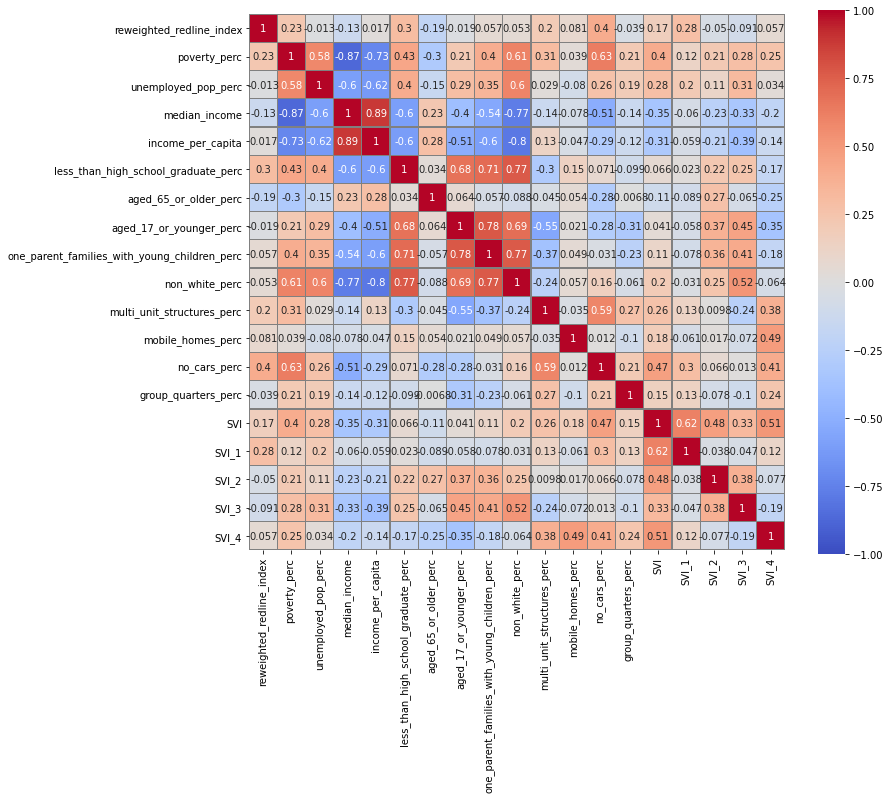

In [ ]:
plt.figure(figsize=(12,10))
sns.heatmap(df_corr.astype(float).corr(method='spearman'), linewidth=0.1, linecolor='grey', vmin=-1.0, vmax=1.0, square=True, cmap='coolwarm', annot=True)

### Create two dataframes for analyses on (a) Redline vs 5 SVI-based indices; and (b) Minority vs 5 SVI-based indices

In [ ]:
df_redline_SVI = df[['reweighted_redline_index','SVI', 'SVI_1', 'SVI_2', 'SVI_3', 'SVI_4']]
df_minority_SVI = df[['non_white_perc_bin','SVI', 'SVI_1', 'SVI_2', 'SVI_3', 'SVI_4']]

#### Correlation Coefficients (All)

Correlation for Redline vs 5 SVI-based Indices

<AxesSubplot:>

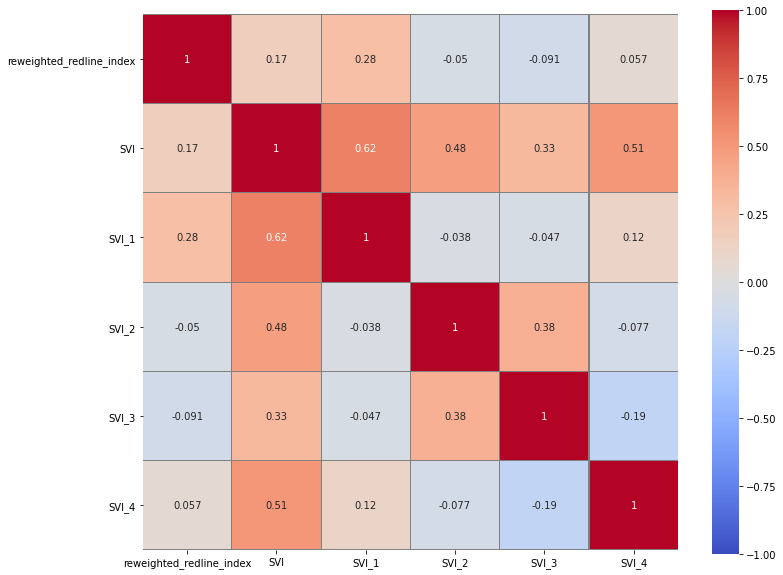

In [ ]:
plt.figure(figsize=(12,10))
sns.heatmap(df_redline_SVI.astype(float).corr(method='spearman'), linewidth=0.1, linecolor='grey', vmin=-1.0, vmax=1.0, square=True, cmap='coolwarm', annot=True)


Correlation for Minority vs 5 SVI-based indices

In [ ]:
df_minority_SVI = df[['non_white_perc_bin','SVI', 'SVI_1', 'SVI_2', 'SVI_3', 'SVI_4']]

<AxesSubplot:>

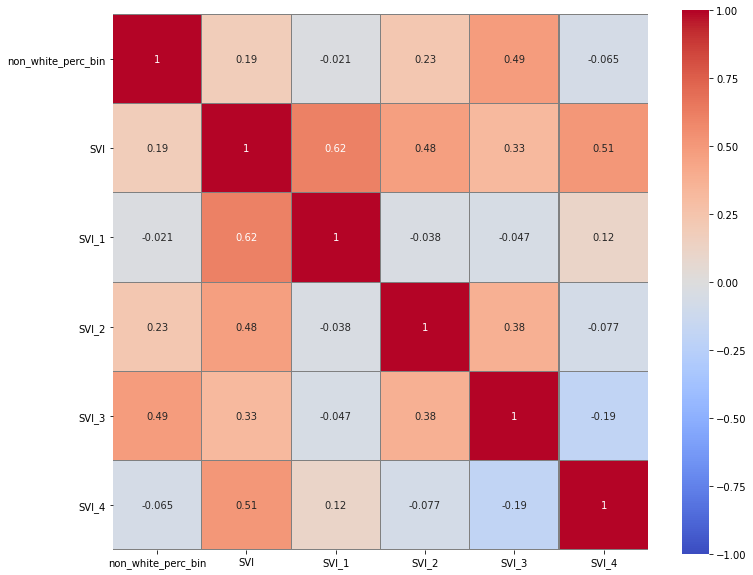

In [ ]:
plt.figure(figsize=(12,10))
sns.heatmap(df_minority_SVI.astype(float).corr(method='spearman'), linewidth=0.1, linecolor='grey', vmin=-1.0, vmax=1.0, square=True, cmap='coolwarm', annot=True)

#### Correlation Coefficients, where p-value < 0.05

Sample size = 168

In [ ]:
# Define functions to (i) get p-values (to be used to mask out corr coef w p-values >= 0.05); (ii) plot the heat map to show only significant corr coef

from scipy import stats

def corr_sig(df=None):
    p_matrix = np.zeros(shape=(df.shape[1],df.shape[1]))
    for col in df.columns:
        for col2 in df.drop(col,axis=1).columns:
            _ , p = stats.spearmanr(df[col],df[col2])
            p_matrix[df.columns.to_list().index(col),df.columns.to_list().index(col2)] = p
    return p_matrix

def plot_cor_matrix(corr, mask=None):
    f, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(corr, ax=ax,
                mask=mask,
                annot=True, vmin=-1, vmax=1, center=0,
                cmap='coolwarm', linewidths=0.1, linecolor='grey',square=True, cbar_kws={'orientation': 'vertical'})

##### Correlation (All)

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


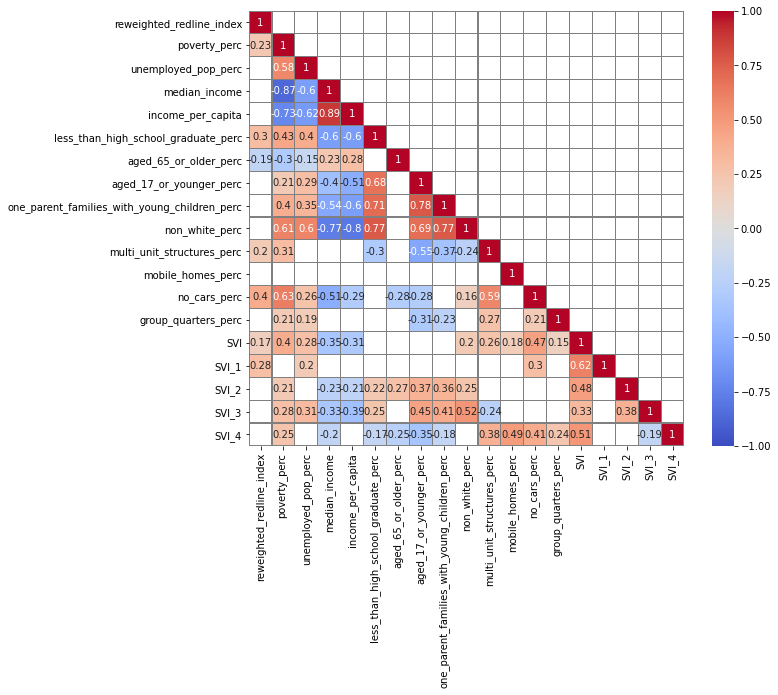

In [ ]:
df_corr.dropna(inplace=True) # Remove missing values, if any

p_values = corr_sig(df_corr.astype(float))  # Convert integer to float before input
mask = np.invert(p_values<0.05)

corr = df_corr.corr(method='spearman')                 # All correlation values between the selected variables
p_values = corr_sig(df_corr)          # p-values for correlation between the selected variables
mask = np.invert(np.tril(p_values<0.05))  # Masking out corr coef w p-values >= 0.05; showing only lower triangle for analysis, as upper triangle is a mirror of the lower

# mask = np.invert(p_values<0.05)         # Un-comment this line to see both triangles (full heat map) 

# Plotting
plot_cor_matrix(corr,mask)

##### Correlation between Redline Index vs 5 SVI-based Indices

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


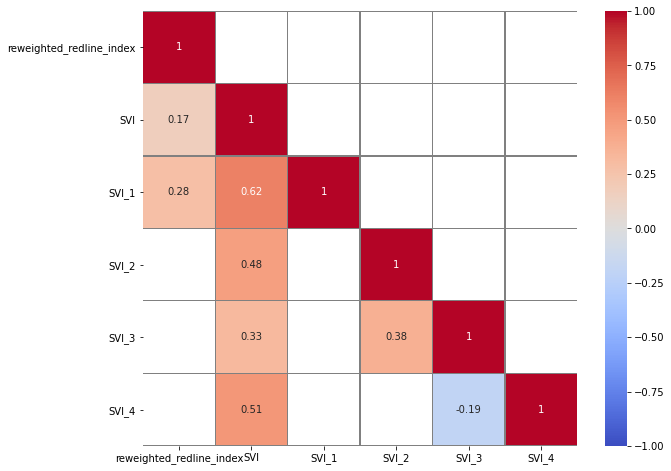

In [ ]:
df_redline_SVI.dropna(inplace=True) # Remove missing values, if any

p_values = corr_sig(df_redline_SVI.astype(float))  # Convert integer to float before input
mask = np.invert(p_values<0.05)

corr = df_redline_SVI.corr(method='spearman')                 # All correlation values between the selected variables
p_values = corr_sig(df_redline_SVI)          # p-values for correlation between the selected variables
mask = np.invert(np.tril(p_values<0.05))  # Masking out corr coef w p-values >= 0.05; showing only lower triangle for analysis, as upper triangle is a mirror of the lower

# mask = np.invert(p_values<0.05)         # Un-comment this line to see both triangles (full heat map) 

# Plotting
plot_cor_matrix(corr,mask)

##### Correlation between Minority vs 5 SVI-based Indices

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


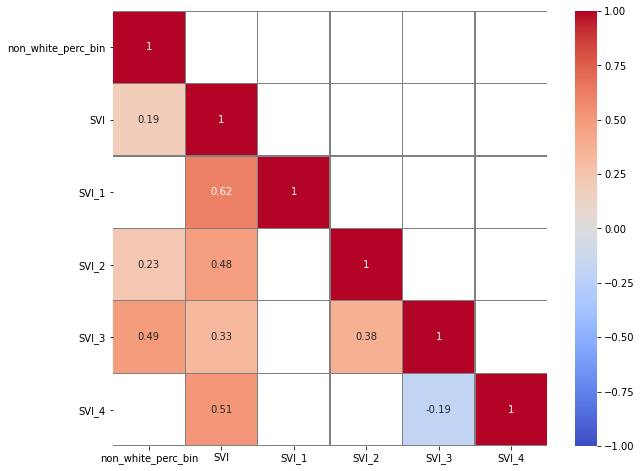

In [ ]:
df_minority_SVI.dropna(inplace=True) # Remove missing values, if any

p_values = corr_sig(df_minority_SVI.astype(float))  # Convert integer to float before input
mask = np.invert(p_values<0.05)

corr = df_minority_SVI.corr(method='spearman')                 # All correlation values between the selected variables
p_values = corr_sig(df_minority_SVI)          # p-values for correlation between the selected variables
mask = np.invert(np.tril(p_values<0.05))  # Masking out corr coef w p-values >= 0.05; showing only lower triangle for analysis, as upper triangle is a mirror of the lower

# mask = np.invert(p_values<0.05)         # Un-comment this line to see both triangles (full heat map) 

# Plotting
plot_cor_matrix(corr,mask)

## Index-level Visuals

### Pair Plots for All SVI-based ACS Variables, as well as SVI-based Indices

Sample size = 168

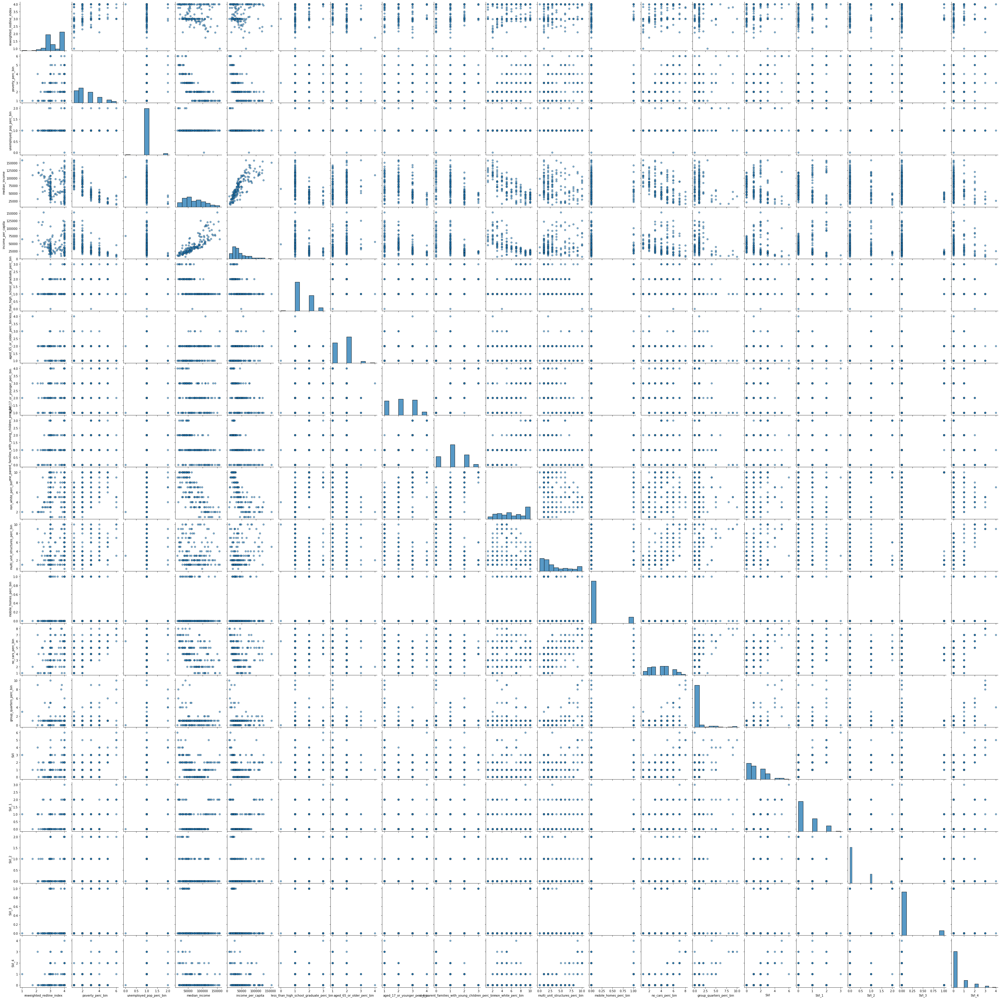

In [ ]:
sns.pairplot(df, plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')
plt.savefig("pair-plot-all-svig.svg")

### Joint Plots for Redline Index vs 5 SVI-based Indices - SVI and SVI_1 ~ SVI_4

Sample size = 168


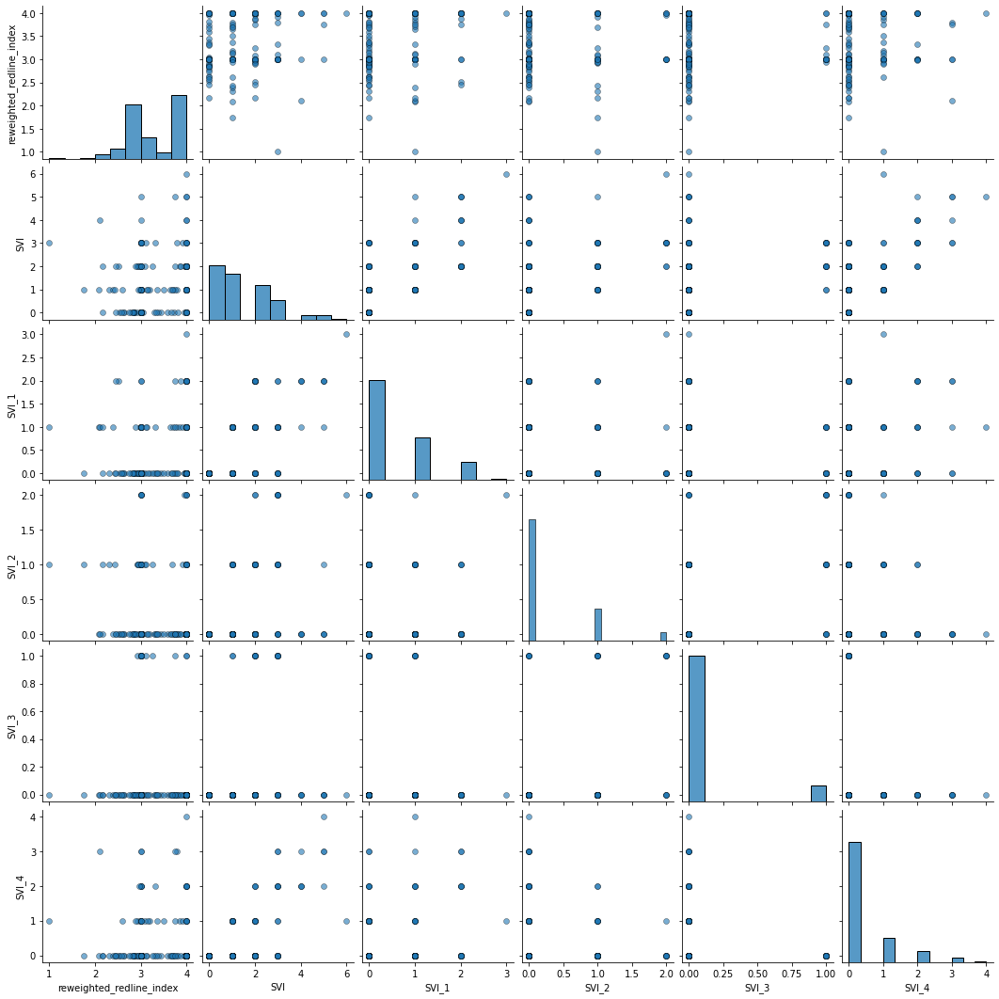

In [ ]:
sns.pairplot(df_redline_SVI, kind = 'scatter', diag_kind = 'hist', plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')

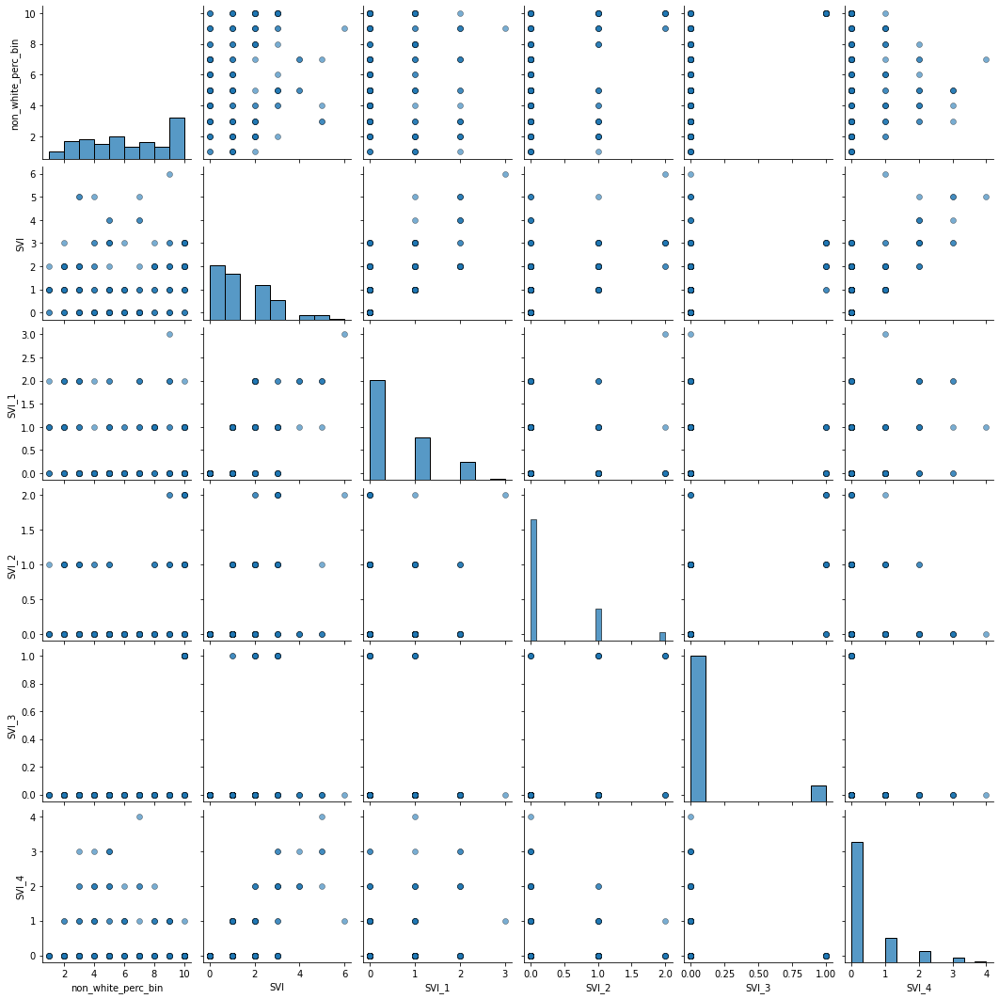

In [ ]:
sns.pairplot(df_minority_SVI, kind = 'scatter', diag_kind = 'hist', plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')

#### Redline Index vs SVI (all flags counted)

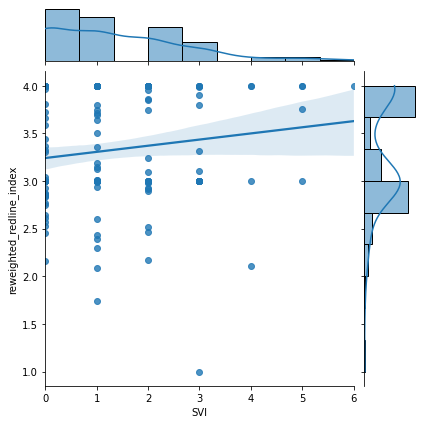

In [ ]:
# Use Jointplot to match up two distplots for bivariate data. Options: scatter, reg, resid, kde, hex

df1 = df_redline_SVI.dropna(subset=['reweighted_redline_index','SVI'])
sns.jointplot(x='SVI',y='reweighted_redline_index',data=df1,kind='reg')

#### Redline Index vs SVI_2 (Theme#1 flags: Socioeconomic Status)

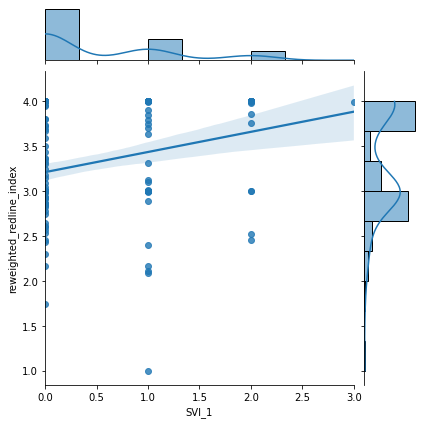

In [ ]:
df1 = df_redline_SVI.dropna(subset=['reweighted_redline_index','SVI_1'])
sns.jointplot(x='SVI_1',y='reweighted_redline_index',data=df1,kind='reg')

#### Redline Index vs SVI_2 (Theme#2 flags: Household Composition & Disability)

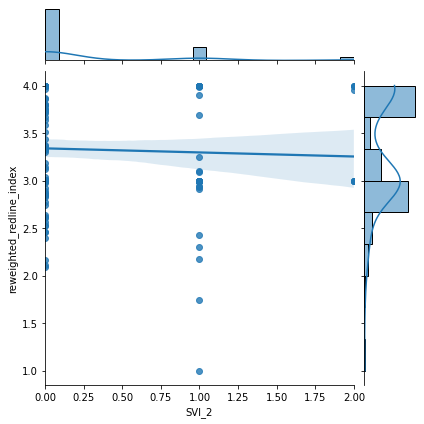

In [ ]:
df1 = df_redline_SVI.dropna(subset=['reweighted_redline_index','SVI_2'])
sns.jointplot(x='SVI_2',y='reweighted_redline_index',data=df1,kind='reg')

#### Redline Index vs SVI_3 (Theme#3 flags: Minority Status & Language)

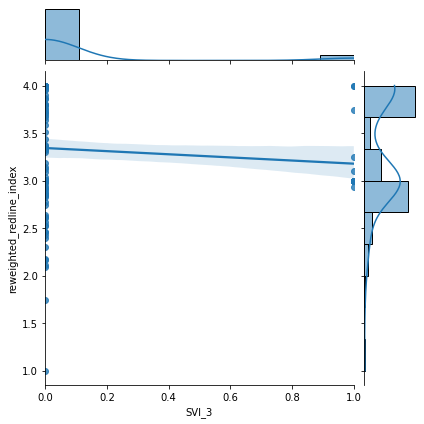

In [ ]:
df1 = df_redline_SVI.dropna(subset=['reweighted_redline_index','SVI_3'])
sns.jointplot(x='SVI_3',y='reweighted_redline_index',data=df1,kind='reg')

#### Redline Index vs SVI_4 (Housing Type & Transportation)

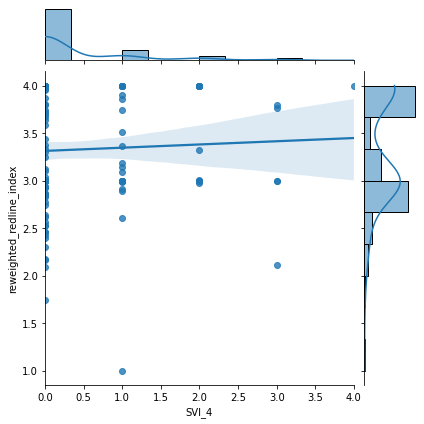

In [ ]:
df1 = df_redline_SVI.dropna(subset=['reweighted_redline_index','SVI_4'])
sns.jointplot(x='SVI_4',y='reweighted_redline_index',data=df1,kind='reg')

## Variable-level Visuals

#### Redline Index vs SVI Theme 1 (Socioeconomic Status) Variables

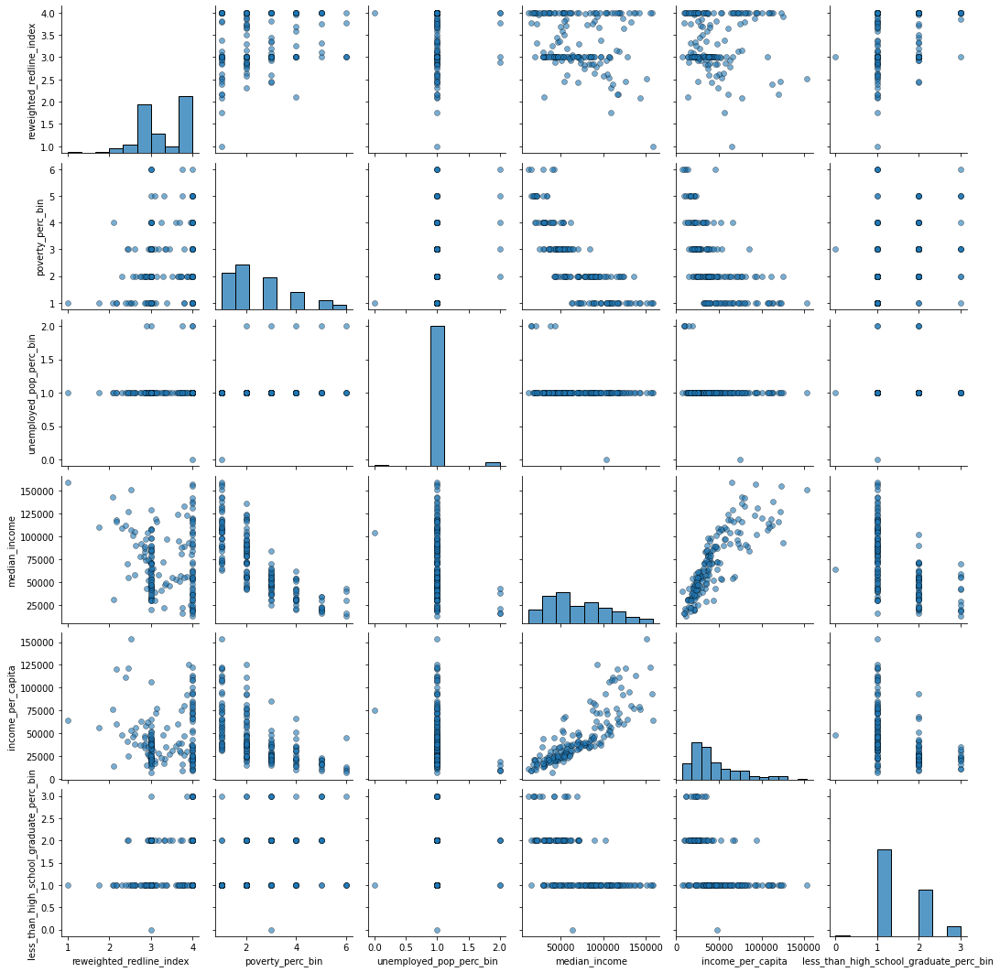

In [ ]:
sns.pairplot(df_ses, plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')

#### Redline Index vs SVI Theme 2 (Household Composition & Disability) Variables

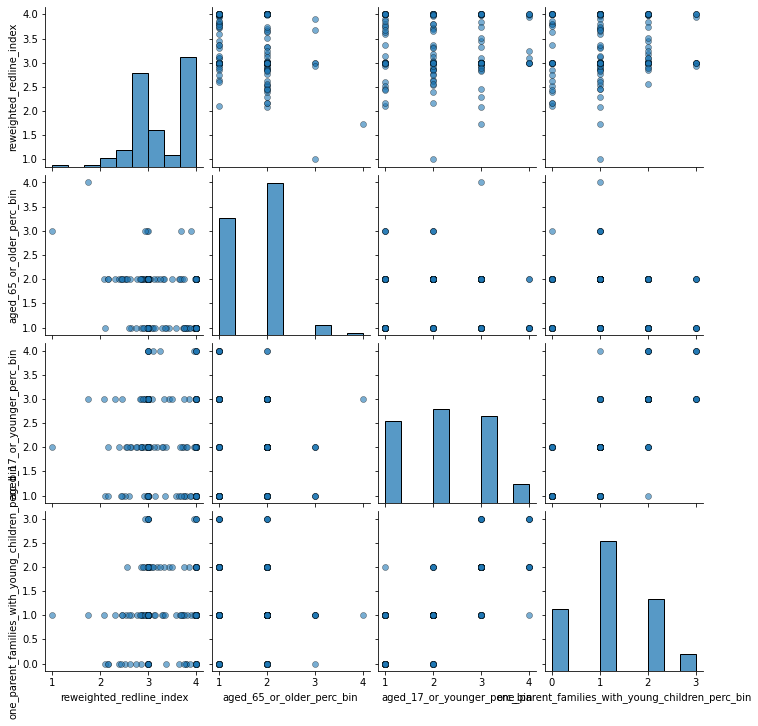

In [ ]:
sns.pairplot(df_hh_composition_disability, plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')

#### Redline Index vs SVI Theme 3 (Minority Status) Variables
(Note: Language variables are not available - all-null for 'speak_spanish_at_home_low_english' variable)

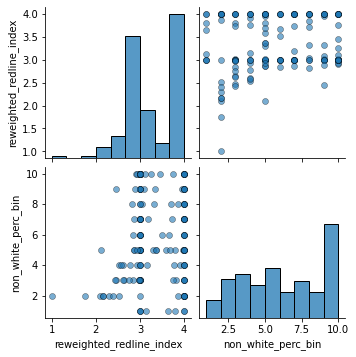

In [ ]:
sns.pairplot(df_minority_status, plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')

#### Redline Index vs SVI Theme 4 (Housing Type & Transportation) Variables

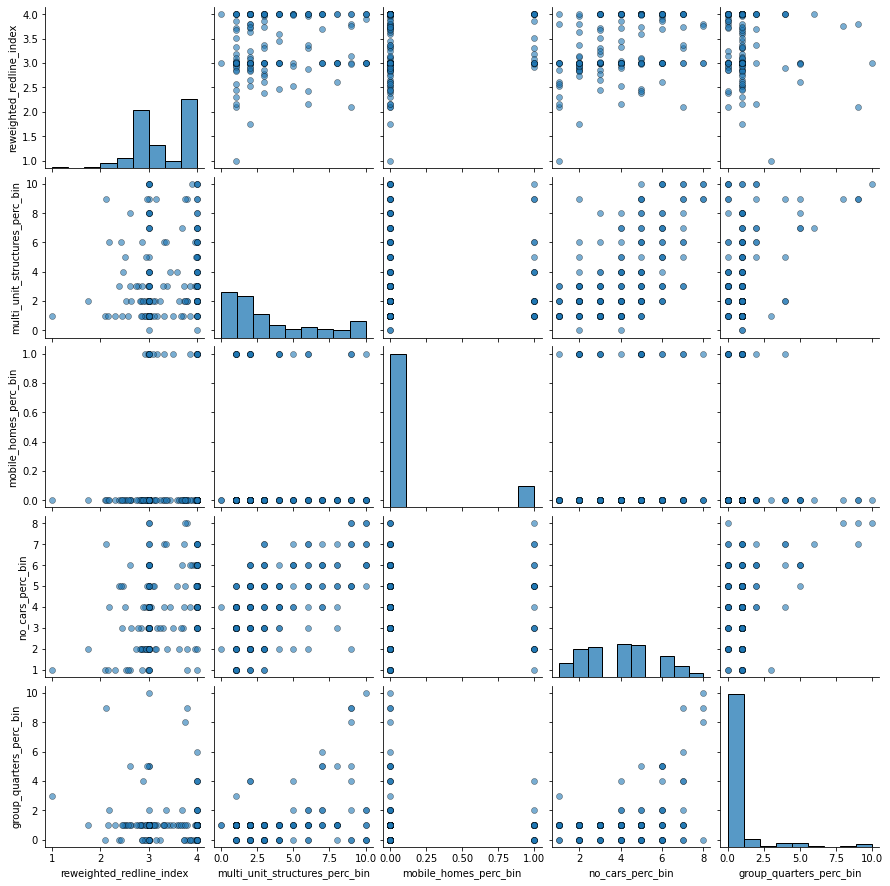

In [ ]:
sns.pairplot(df_housing_transport, plot_kws = {'alpha': 0.6, 'edgecolor': 'black'}, palette = 'winter')

In [ ]:
# fig = px.box(df, x="reweighted_redline_index")
# fig.show()

### Joint Plots
##### (Note: To select more variables of interest)

In [ ]:
# To-dos:
### [Akash] 5 SVIs vs rental prioritisation
### [Muhammad] 5 SVIs vs sdoh

### 5 SVI-based Indices vs Minority (i.e. Non-White percentage, binned)

#### SVI (All Flags) vs Minority

In [ ]:
df1 = df.dropna(subset=['SVI','non_white_perc_bin'])
sns.jointplot(x='non_white_perc_bin',y='SVI',data=df1,kind='reg')

#### SVI_1 (Theme#1 SES flags) vs Minority

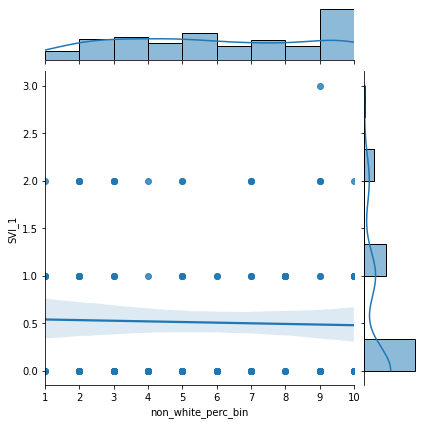

In [ ]:
df1 = df.dropna(subset=['SVI_1','non_white_perc_bin'])
sns.jointplot(x='non_white_perc_bin',y='SVI_1',data=df1,kind='reg')

#### SVI_2 (Theme#2 Household Composition flags)vs Minority

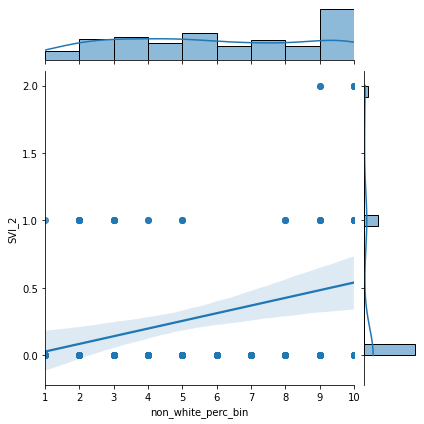

In [ ]:
df1 = df.dropna(subset=['SVI_2','non_white_perc_bin'])
sns.jointplot(x='non_white_perc_bin',y='SVI_2',data=df1,kind='reg')

#### SVI_3 (Theme#3 Minority flags) vs Minority
(Note: This is passed - Minority flags are derived from non-white percentage.)

#### SVI_4 (Theme#4 Housing flags) vs Minority

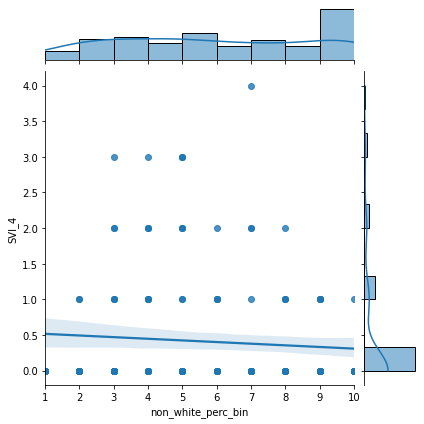

In [ ]:
df1 = df.dropna(subset=['SVI_4','non_white_perc_bin'])
sns.jointplot(x='non_white_perc_bin',y='SVI_4',data=df1,kind='reg')

### Redline vs Minority (i.e. Non-White percentage, binned)

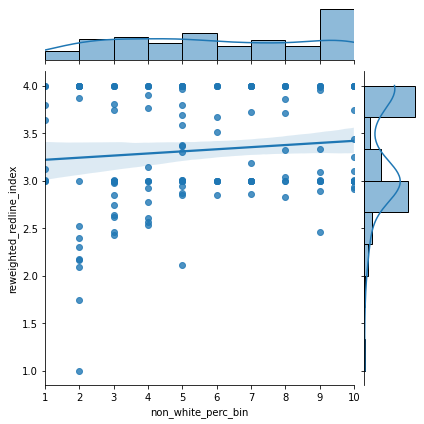

In [ ]:
df1 = df.dropna(subset=['reweighted_redline_index','non_white_perc_bin'])
sns.jointplot(x='non_white_perc_bin',y='reweighted_redline_index',data=df1,kind='reg')

## Spatial Correlations/Relationships between SVI variables and Redlining Index

In [ ]:
#Main dataset
gdf_Boston.head()

,geo_id,city_name,redline_index,do_date,total_pop,households,male_pop,female_pop,median_age,male_under_5,...,in_undergrad_college,speak_only_english_at_home,speak_spanish_at_home,speak_spanish_at_home_low_english,aged_65_or_older,aged_17_or_younger,multi_unit_structures,non_white,reweighted_redline_index,ordinal_value
0,2.502506e+10,Boston,100,2014-01-01,4071,2005,2173,1898,31.4,135,...,86,NaN,NaN,NaN,196,476,233,351,3.792748,4
1,2.502506e+10,Boston,100,2014-01-01,2300,1094,914,1386,29.4,68,...,127,NaN,NaN,NaN,173,751,249,1892,3.996286,4
2,2.502507e+10,Boston,100,2014-01-01,7075,3493,3534,3541,31.7,158,...,1376,NaN,NaN,NaN,819,536,4257,3359,4.000000,4
3,2.502507e+10,Boston,100,2014-01-01,2398,1136,1157,1241,39.4,0,...,242,NaN,NaN,NaN,465,230,922,1683,4.000000,4
4,2.502507e+10,Boston,100,2014-01-01,4290,2185,2095,2195,37.0,94,...,49,NaN,NaN,NaN,485,489,1323,2238,4.000000,4


In [ ]:
#Recreating SVI variables for this dataset
SVI_Vars = ['geo_id','reweighted_redline_index','poverty','unemployed_pop','median_income','income_per_capita','less_than_high_school_graduate',
'aged_65_or_older','aged_17_or_younger','one_parent_families_with_young_children',
'non_white','multi_unit_structures','mobile_homes','no_cars','group_quarters',
'pop_determined_poverty_status','total_pop','households','housing_units', 'reweighted_redline_index','ordinal_value']

In [ ]:
#Subsetting SVI variables
gdf_Boston = gdf_Boston[SVI_Vars]
gdf_Boston.head()

,geo_id,reweighted_redline_index,poverty,unemployed_pop,median_income,income_per_capita,less_than_high_school_graduate,aged_65_or_older,aged_17_or_younger,one_parent_families_with_young_children,...,multi_unit_structures,mobile_homes,no_cars,group_quarters,pop_determined_poverty_status,total_pop,households,housing_units,reweighted_redline_index,ordinal_value
0,2.502506e+10,3.792748,135.0,101.0,132750.0,80548.0,90.0,196,476,0.0,...,233,0,394.0,0,4071.0,4071,2005,2154,3.792748,4
1,2.502506e+10,3.996286,1304.0,212.0,12759.0,11501.0,473.0,173,751,218.0,...,249,0,684.0,0,2300.0,2300,1094,1164,3.996286,4
2,2.502507e+10,4.000000,1292.0,309.0,84083.0,85562.0,656.0,819,536,0.0,...,4257,0,2040.0,1175,6037.0,7075,3493,4585,4.000000,4
3,2.502507e+10,4.000000,752.0,96.0,28851.0,35524.0,482.0,465,230,12.0,...,922,0,535.0,113,2303.0,2398,1136,1273,4.000000,4
4,2.502507e+10,4.000000,1150.0,151.0,52676.0,53710.0,415.0,485,489,97.0,...,1323,11,973.0,351,4199.0,4290,2185,2272,4.000000,4


In [ ]:
# Remove duplicates and null values from the SVI-based variables dataset before further processing
gdf_Boston.drop_duplicates(inplace=True)
gdf_Boston.dropna(inplace=True)

In [ ]:
# Aggregating variables and normalising them
# Setting flags for the tracts which are ranked at 90th percentile and above

gdf_Boston['poverty_perc'] = gdf_Boston['poverty']/gdf_Boston['pop_determined_poverty_status']
gdf_Boston['poverty_perc_bin'] = gdf_Boston['poverty_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['poverty_perc'] >= gdf_Boston['poverty_perc'].quantile(0.9), 'poverty_flag'] = 1
gdf_Boston['poverty_flag'] = gdf_Boston['poverty_flag'].fillna(0)

gdf_Boston['unemployed_pop_perc'] = gdf_Boston['unemployed_pop'] / gdf_Boston['total_pop']
gdf_Boston['unemployed_pop_perc_bin'] = gdf_Boston['unemployed_pop_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['unemployed_pop_perc'] >= gdf_Boston['unemployed_pop_perc'].quantile(0.9), 'unemployed_flag'] = 1
gdf_Boston['unemployed_flag'] = gdf_Boston['unemployed_flag'].fillna(0)

gdf_Boston['less_than_high_school_graduate_perc'] = gdf_Boston['less_than_high_school_graduate'] / gdf_Boston['total_pop']
gdf_Boston['less_than_high_school_graduate_perc_bin'] = gdf_Boston['less_than_high_school_graduate_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['less_than_high_school_graduate_perc'] >= gdf_Boston['less_than_high_school_graduate_perc'].quantile(0.9), 'less_than_high_school_graduate_flag'] = 1
gdf_Boston['less_than_high_school_graduate_flag'] = gdf_Boston['less_than_high_school_graduate_flag'].fillna(0)

gdf_Boston['aged_65_or_older_perc'] = gdf_Boston['aged_65_or_older'] / gdf_Boston['total_pop']
gdf_Boston['aged_65_or_older_perc_bin'] = gdf_Boston['aged_65_or_older_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['aged_65_or_older_perc'] >= gdf_Boston['aged_65_or_older_perc'].quantile(0.9), 'aged_65_or_older_flag'] = 1
gdf_Boston['aged_65_or_older_flag'] = gdf_Boston['aged_65_or_older_flag'].fillna(0)

gdf_Boston['aged_17_or_younger_perc'] = gdf_Boston['aged_17_or_younger'] / gdf_Boston['total_pop']
gdf_Boston['aged_17_or_younger_perc_bin'] = gdf_Boston['aged_17_or_younger_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['aged_17_or_younger_perc'] >= gdf_Boston['aged_17_or_younger_perc'].quantile(0.9), 'aged_17_or_younger_flag'] = 1
gdf_Boston['aged_17_or_younger_flag'] = gdf_Boston['aged_17_or_younger_flag'].fillna(0)

gdf_Boston['one_parent_families_with_young_children_perc'] = gdf_Boston['one_parent_families_with_young_children'] / gdf_Boston['households']
gdf_Boston['one_parent_families_with_young_children_perc_bin'] = gdf_Boston['one_parent_families_with_young_children_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['one_parent_families_with_young_children_perc'] >= gdf_Boston['one_parent_families_with_young_children_perc'].quantile(0.9), 'one_parent_families_with_young_children_flag'] = 1
gdf_Boston['one_parent_families_with_young_children_flag'] = gdf_Boston['one_parent_families_with_young_children_flag'].fillna(0)

gdf_Boston['non_white_perc'] = gdf_Boston['non_white'] / gdf_Boston['total_pop']
gdf_Boston['non_white_perc_bin'] = gdf_Boston['non_white_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['non_white_perc'] >= gdf_Boston['non_white_perc'].quantile(0.9), 'non_white_flag'] = 1
gdf_Boston['non_white_flag'] = gdf_Boston['non_white_flag'].fillna(0)

gdf_Boston['multi_unit_structures_perc'] = gdf_Boston['multi_unit_structures'] / gdf_Boston['housing_units']
gdf_Boston['multi_unit_structures_perc_bin'] = gdf_Boston['multi_unit_structures_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['multi_unit_structures_perc'] >= gdf_Boston['multi_unit_structures_perc'].quantile(0.9), 'multi_unit_structures_flag'] = 1
gdf_Boston['multi_unit_structures_flag'] = gdf_Boston['multi_unit_structures_flag'].fillna(0)

gdf_Boston['mobile_homes_perc'] = gdf_Boston['mobile_homes'] / gdf_Boston['housing_units']
gdf_Boston['mobile_homes_perc_bin'] = gdf_Boston['mobile_homes_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['mobile_homes_perc'] >= gdf_Boston['mobile_homes_perc'].quantile(0.9), 'mobile_homes_flag'] = 1
gdf_Boston['mobile_homes_flag'] = gdf_Boston['mobile_homes_flag'].fillna(0)

gdf_Boston['no_cars_perc'] = gdf_Boston['no_cars'] / gdf_Boston['households']
gdf_Boston['no_cars_perc_bin'] = gdf_Boston['no_cars_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['no_cars_perc'] >= gdf_Boston['no_cars_perc'].quantile(0.9), 'no_cars_flag'] = 1
gdf_Boston['no_cars_flag'] = gdf_Boston['no_cars_flag'].fillna(0)

gdf_Boston['group_quarters_perc'] = gdf_Boston['group_quarters'] / gdf_Boston['total_pop']
gdf_Boston['group_quarters_perc_bin'] = gdf_Boston['group_quarters_perc'].apply(perc_bin)
gdf_Boston.loc[gdf_Boston['group_quarters_perc'] >= gdf_Boston['group_quarters_perc'].quantile(0.9), 'group_quarters_flag'] = 1
gdf_Boston['group_quarters_flag'] = gdf_Boston['group_quarters_flag'].fillna(0)

In [ ]:
# Repeat flag setting for variables which do not requirea normalisation
# Setting flags for the tracts which are ranked at 90th percentile and above

gdf_Boston.loc[gdf_Boston['median_income'] >= gdf_Boston['median_income'].quantile(0.9), 'median_income_flag'] = 1
gdf_Boston['median_income_flag'] = gdf_Boston['median_income_flag'].fillna(0)

gdf_Boston.loc[gdf_Boston['income_per_capita'] >= gdf_Boston['income_per_capita'].quantile(0.9), 'income_per_capita_flag'] = 1
gdf_Boston['income_per_capita_flag'] = gdf_Boston['income_per_capita_flag'].fillna(0)

In [ ]:
# The number of flags (for each tract), all SVI-based variables
gdf_Boston['SVI'] = gdf_Boston['poverty_flag'] + gdf_Boston['unemployed_flag'] + gdf_Boston['median_income_flag'] + gdf_Boston['income_per_capita_flag'] + gdf_Boston['less_than_high_school_graduate_flag'] + gdf_Boston['aged_65_or_older_flag'] + gdf_Boston['aged_17_or_younger_flag'] + gdf_Boston['one_parent_families_with_young_children_flag'] + gdf_Boston['non_white_flag'] + gdf_Boston['multi_unit_structures_flag'] + gdf_Boston['mobile_homes_flag'] + gdf_Boston['no_cars_flag'] + gdf_Boston['group_quarters_flag']

# The number of flags (for each tract); Theme#1: Socioeconomic Status
gdf_Boston['SVI_1'] = gdf_Boston['poverty_flag'] + gdf_Boston['unemployed_flag'] + gdf_Boston['median_income_flag'] + gdf_Boston['income_per_capita_flag'] + gdf_Boston['less_than_high_school_graduate_flag']

# The number of flags (for each tract); Theme#2: Household Composition & Disability
gdf_Boston['SVI_2'] = gdf_Boston['aged_65_or_older_flag'] + gdf_Boston['aged_17_or_younger_flag'] + gdf_Boston['one_parent_families_with_young_children_flag']

# The number of flags (for each tract); Theme#3: Minority Status & Language
gdf_Boston['SVI_3'] = gdf_Boston['non_white_flag']

# The number of flags (for each tract); Theme#4: Housing Type & Transportation
gdf_Boston['SVI_4'] = gdf_Boston['multi_unit_structures_flag'] + gdf_Boston['mobile_homes_flag'] + gdf_Boston['no_cars_flag'] + gdf_Boston['group_quarters_flag']

In [ ]:
gdf_Boston.head()

,geo_id,reweighted_redline_index,poverty,unemployed_pop,median_income,income_per_capita,less_than_high_school_graduate,aged_65_or_older,aged_17_or_younger,one_parent_families_with_young_children,...,group_quarters_perc,group_quarters_perc_bin,group_quarters_flag,median_income_flag,income_per_capita_flag,SVI,SVI_1,SVI_2,SVI_3,SVI_4
0,2.502506e+10,3.792748,135.0,101.0,132750.0,80548.0,90.0,196,476,0.0,...,0.000000,0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
1,2.502506e+10,3.996286,1304.0,212.0,12759.0,11501.0,473.0,173,751,218.0,...,0.000000,0,0.0,0.0,0.0,6.0,3.0,2.0,0.0,1.0
2,2.502507e+10,4.000000,1292.0,309.0,84083.0,85562.0,656.0,819,536,0.0,...,0.166078,2,1.0,0.0,1.0,3.0,1.0,0.0,0.0,2.0
3,2.502507e+10,4.000000,752.0,96.0,28851.0,35524.0,482.0,465,230,12.0,...,0.047123,1,0.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0
4,2.502507e+10,4.000000,1150.0,151.0,52676.0,53710.0,415.0,485,489,97.0,...,0.081818,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Merging with geo file for spatial analysis

import geopandas as gpd
#Loading MASS geofile
boston_geodf = gpd.read_file('/work/COVIDRedlining/data/boston/boston census tracts/tl_2019_25_tract.shp')

#Taking only geo-values for boston
boston_geoid = list(df_redline['geo_id'])

#Renaming columns 
boston_geodf = boston_geodf.rename(columns={'GEOID':'geo_id'})

#Converting data types
boston_geodf['geo_id'] = boston_geodf['geo_id'].astype(float) 

#Subsetting only boston valyes
boston_geodf = boston_geodf.loc[boston_geodf['geo_id'].isin(boston_geoid)]

#Merging SVI with geo df 
gdf_Boston = boston_geodf.merge(gdf_Boston, on ='geo_id', how ='left')
gdf_Boston.head()

,STATEFP,COUNTYFP,TRACTCE,geo_id,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,group_quarters_perc,group_quarters_perc_bin,group_quarters_flag,median_income_flag,income_per_capita_flag,SVI,SVI_1,SVI_2,SVI_3,SVI_4
0,25,025,010600,2.502501e+10,106,Census Tract 106,G5020,S,339678,0,...,0.000000,0.0,0.0,0.0,1.0,3.0,1.0,1.0,0.0,1.0
1,25,025,120500,2.502512e+10,1205,Census Tract 1205,G5020,S,213706,0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,25,025,070600,2.502507e+10,706,Census Tract 706,G5020,S,133036,0,...,0.002345,1.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0,0.0
3,25,025,140201,2.502514e+10,1402.01,Census Tract 1402.01,G5020,S,1322336,99423,...,0.002828,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,25,025,082100,2.502508e+10,821,Census Tract 821,G5020,S,370577,0,...,0.003130,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
gdf_Boston.columns

Index(['STATEFP', 'COUNTYFP', 'TRACTCE', 'geo_id', 'NAME', 'NAMELSAD', 'MTFCC',
       'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry',
       'reweighted_redline_index', 'poverty', 'unemployed_pop',
       'median_income', 'income_per_capita', 'less_than_high_school_graduate',
       'aged_65_or_older', 'aged_17_or_younger',
       'one_parent_families_with_young_children', 'non_white',
       'multi_unit_structures', 'mobile_homes', 'no_cars', 'group_quarters',
       'pop_determined_poverty_status', 'total_pop', 'households',
       'housing_units', 'reweighted_redline_index', 'ordinal_value',
       'poverty_perc', 'poverty_perc_bin', 'poverty_flag',
       'unemployed_pop_perc', 'unemployed_pop_perc_bin', 'unemployed_flag',
       'less_than_high_school_graduate_perc',
       'less_than_high_school_graduate_perc_bin',
       'less_than_high_school_graduate_flag', 'aged_65_or_older_perc',
       'aged_65_or_older_perc_bin', 'aged_65_or_older_flag',
       'aged_17

## SVI + Redlining Index Correlation

In [ ]:
#Importing spatial libraries
import fiona.crs
from libpysal.weights.contiguity import Queen
from libpysal import examples
from libpysal import weights
import esda
from esda.moran import Moran, Moran_Local,Moran_BV, Moran_Local_BV
from splot.esda import lisa_cluster, plot_moran_bv_simulation, plot_moran_bv, plot_local_autocorrelation, moran_scatterplot

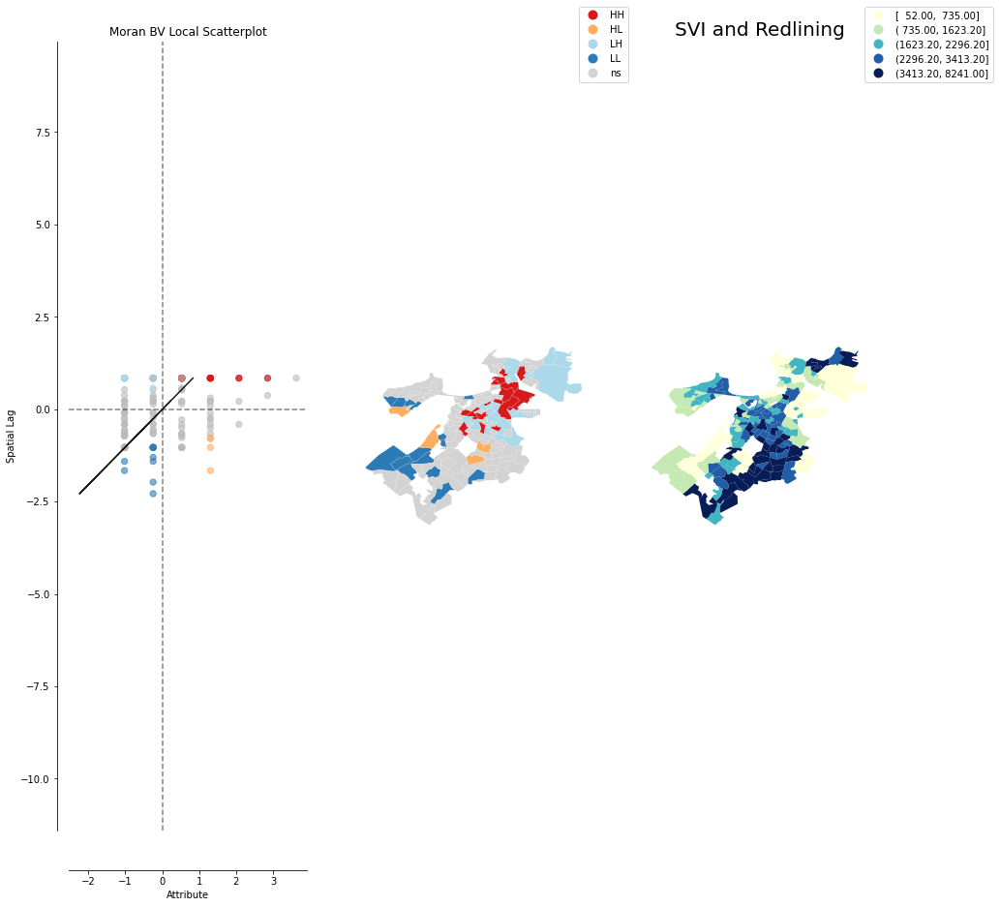

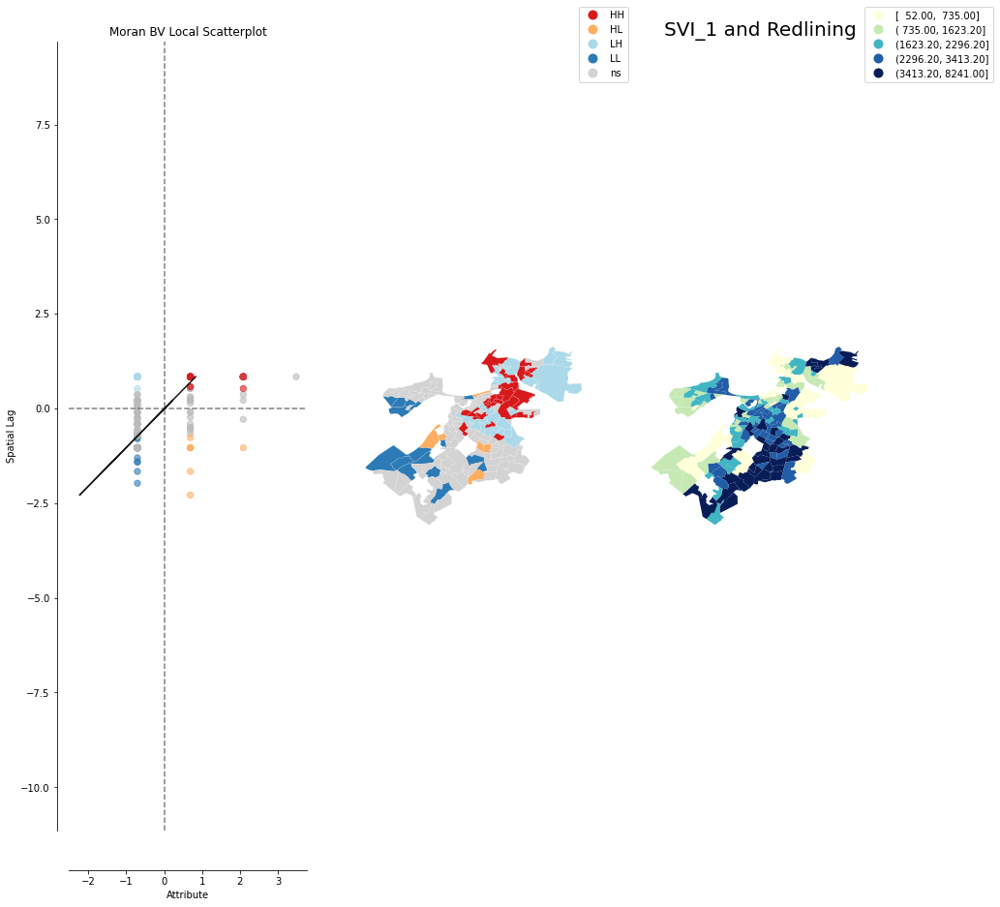

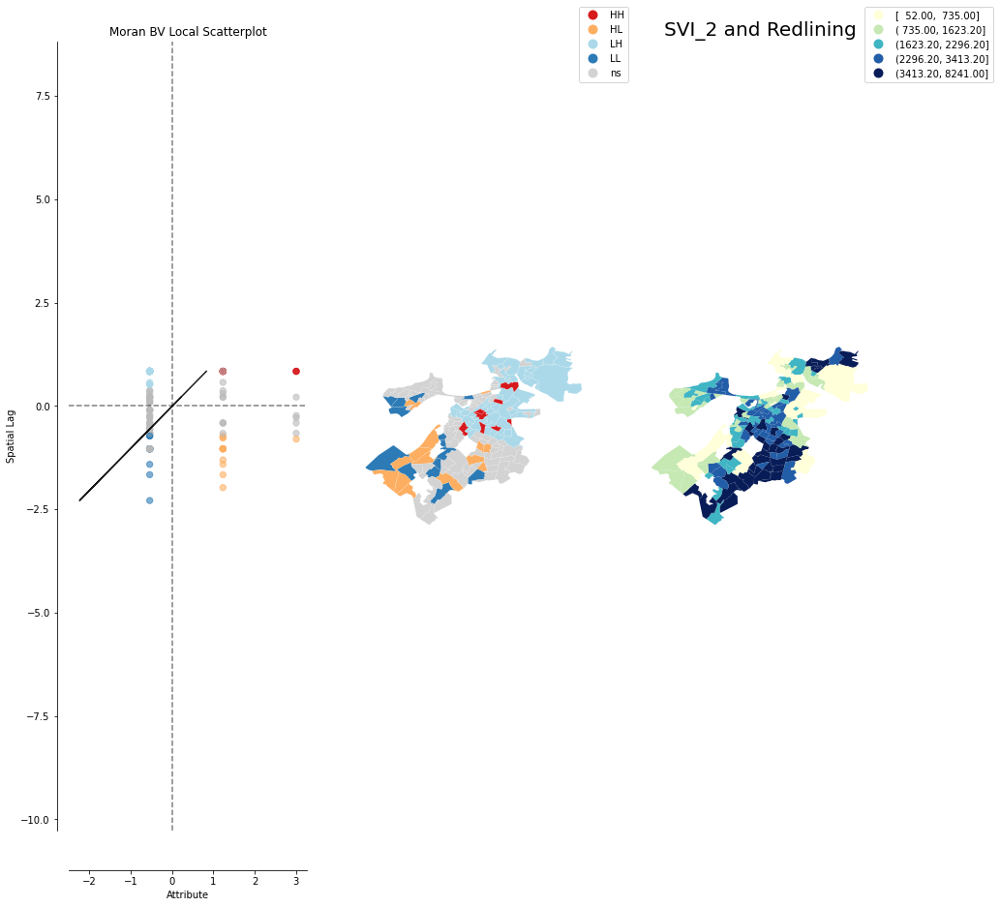

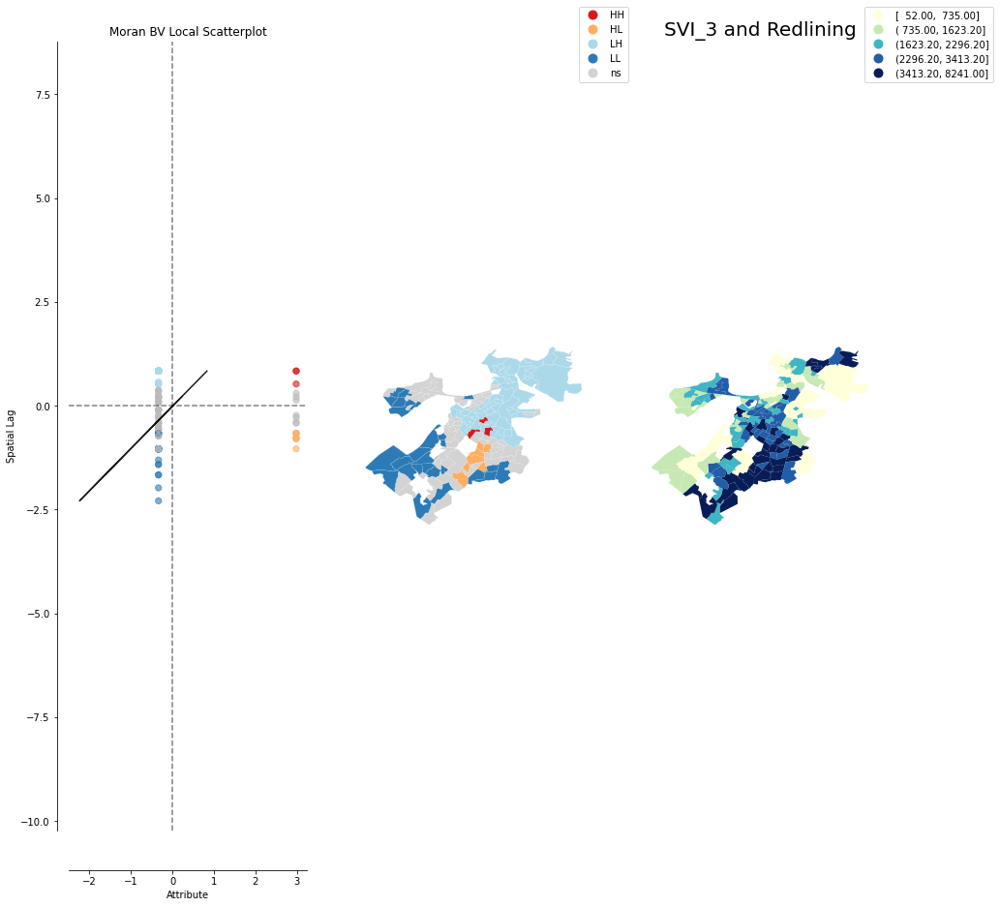

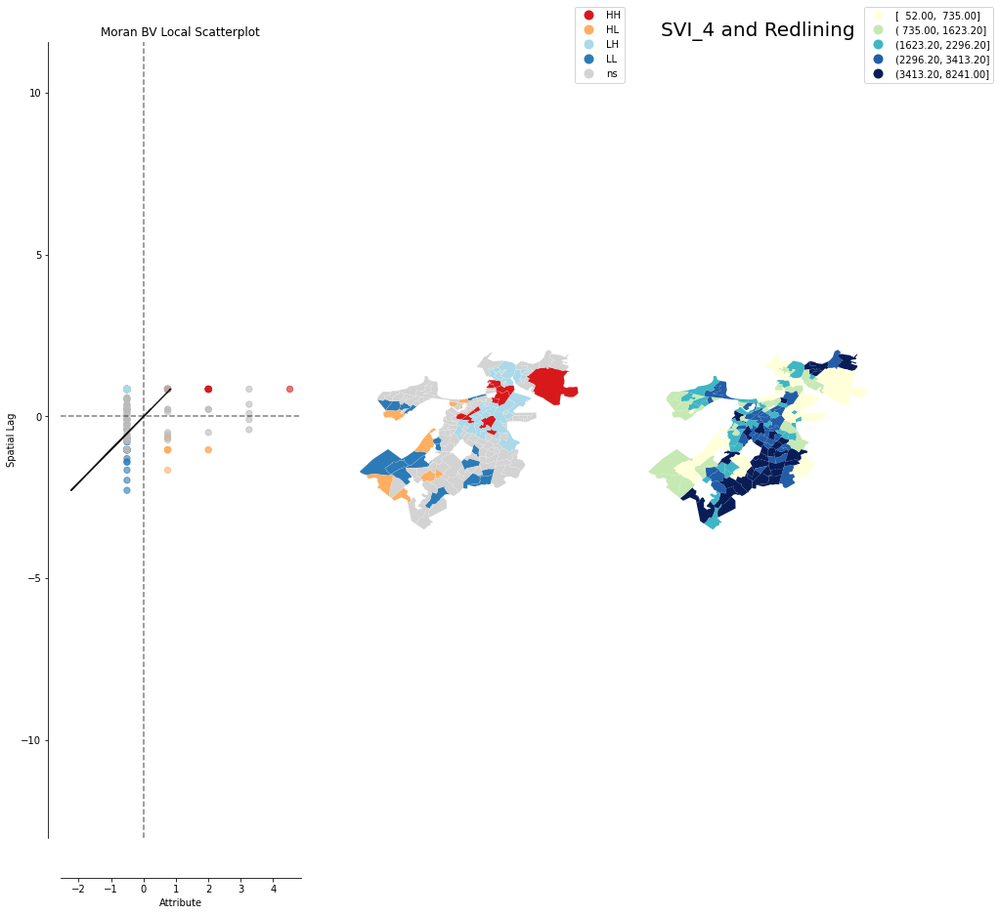

In [ ]:
#Creating spatial indices and running correlations

#Creating an empty df for storing the results of the correlation
spatial_corr = pd.DataFrame(columns=['SVI','SES','Household_Composition','Minority','Housing_Transportation'])

#Dropping null values
gdf_Boston = gdf_Boston.dropna()

#Renaming columns 
gdf_Boston = gdf_Boston.rename(columns={'ordinal_value':'redlining_index'})

#Getting all SVI columns
SVI_corr_vars = ['SVI','SVI_1','SVI_2','SVI_3','SVI_4']

#Spatial transformations
w = Queen.from_dataframe(gdf_Boston)
w.transform = 'R'

#Storing values of correlation in a list
corr_list = []
for i in SVI_corr_vars:
#Running spatial correlations
    y = gdf_Boston[i].values
    x = gdf_Boston['redlining_index'].values
    moran = Moran(y,w)
    moran_loc = Moran_Local(y, w)
    moran_bv = Moran_BV(y, x, w)
    moran_loc_bv = Moran_Local_BV(y, x, w, permutations = 999)
    corr_list.append(moran_bv.I)
    plot_local_autocorrelation(moran_loc_bv, gdf_Boston, 'non_white', figsize=(15,15))
    #Adding a column for cluster values
    gdf_Boston['{}_cluster'.format(i)] = moran_loc_bv.q 
    plt.title('{} and Redlining'.format(i), fontdict={'fontsize':20})
    plt.show()


df_length = len(spatial_corr)
spatial_corr.loc[df_length] = corr_list

In [ ]:
spatial_corr.head()

,SVI,SES,Household_Composition,Minority,Housing_Transportation
0,0.166732,0.285102,-0.073436,-0.074895,0.094731


In [ ]:
#Reassigning cluster values such that 1 = HH, 2 = HL, 3 = LH, 4 = LL
def cluster_assign(row):

    if row == 2:
        val = 3
    elif row == 3:
        val = 4
    elif row == 4:
        val = 2
    else:
        val = 1

    return val

In [ ]:
#Applying clusters

gdf_Boston['SVI'] = gdf_Boston['SVI'].apply(cluster_assign)
gdf_Boston['SVI_1_cluster'] = gdf_Boston['SVI_1_cluster'].apply(cluster_assign)
gdf_Boston['SVI_2_cluster'] = gdf_Boston['SVI_2_cluster'].apply(cluster_assign)
gdf_Boston['SVI_3_cluster'] = gdf_Boston['SVI_3_cluster'].apply(cluster_assign)
gdf_Boston['SVI_4_cluster'] = gdf_Boston['SVI_4_cluster'].apply(cluster_assign)

In [ ]:
gdf_Boston.head()

,STATEFP,COUNTYFP,TRACTCE,geo_id,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,SVI,SVI_1,SVI_2,SVI_3,SVI_4,SVI_cluster,SVI_1_cluster,SVI_2_cluster,SVI_3_cluster,SVI_4_cluster
0,25,025,010600,2.502501e+10,106,Census Tract 106,G5020,S,339678,0,...,4,1.0,1.0,0.0,1.0,1,1,1,3,1
1,25,025,120500,2.502512e+10,1205,Census Tract 1205,G5020,S,213706,0,...,1,0.0,0.0,0.0,0.0,3,4,4,4,4
2,25,025,070600,2.502507e+10,706,Census Tract 706,G5020,S,133036,0,...,3,2.0,0.0,0.0,0.0,1,1,3,3,3
3,25,025,140201,2.502514e+10,1402.01,Census Tract 1402.01,G5020,S,1322336,99423,...,1,0.0,0.0,0.0,0.0,3,4,4,4,4
4,25,025,082100,2.502508e+10,821,Census Tract 821,G5020,S,370577,0,...,1,0.0,0.0,0.0,0.0,3,4,4,4,4


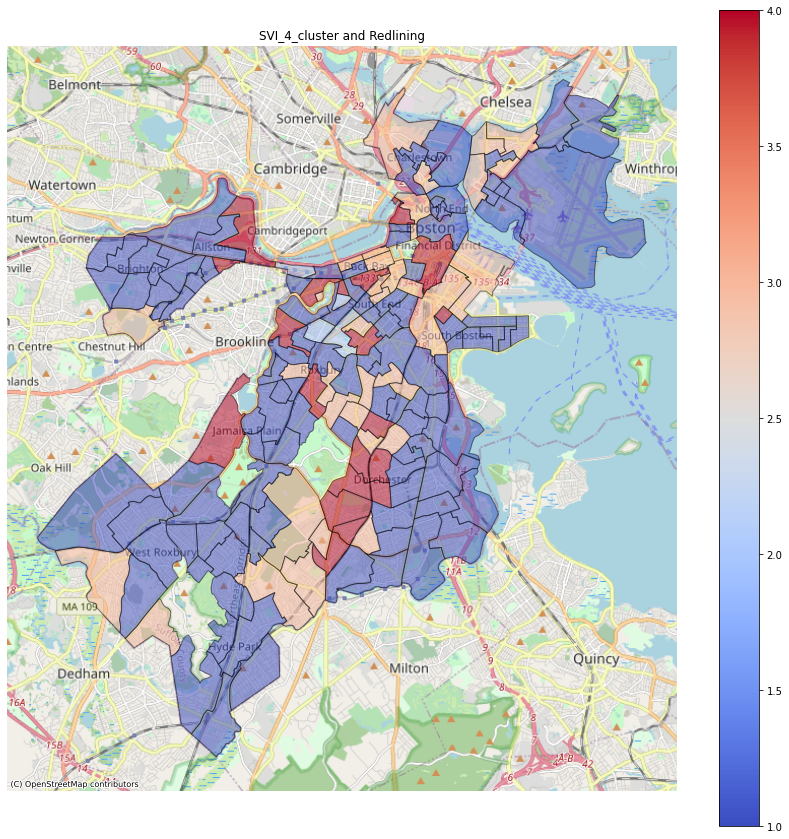

In [ ]:
ax = gdf_Boston.to_crs('EPSG:3857').plot(column='SVI',figsize=(15, 15), alpha=0.5, edgecolor='k', cmap = "coolwarm",legend=True)
ctx.add_basemap(ax, zoom=12, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title('{} and Redlining'.format(i))
ax.set_axis_off()

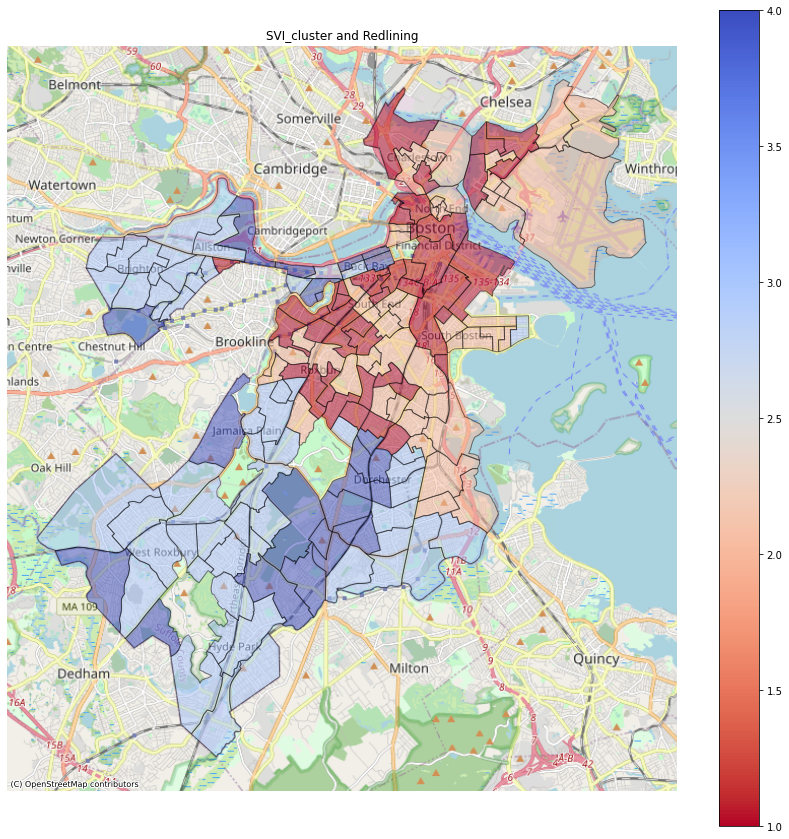

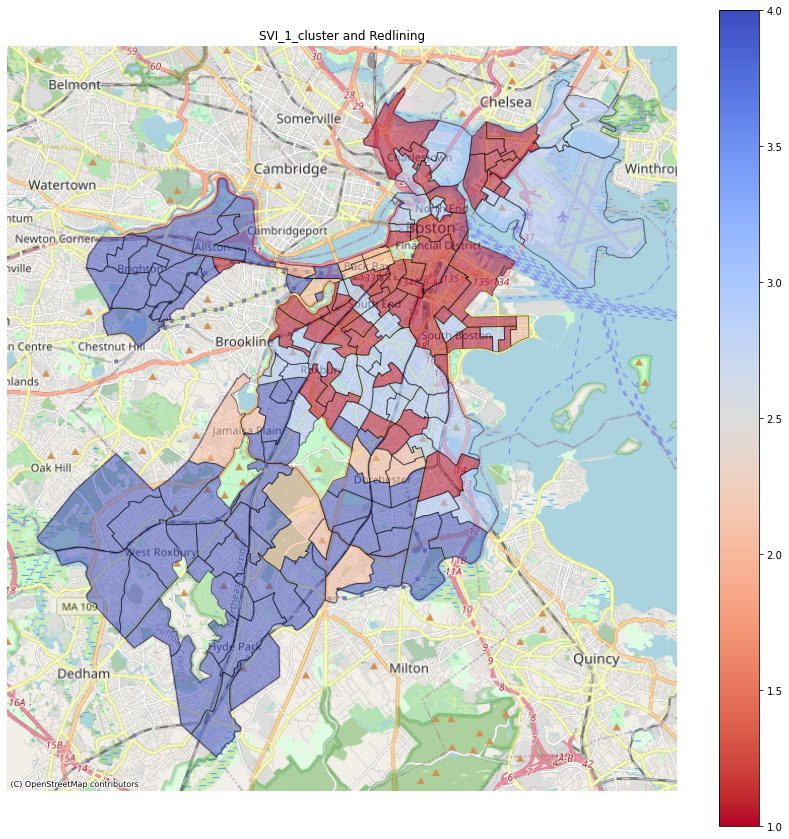

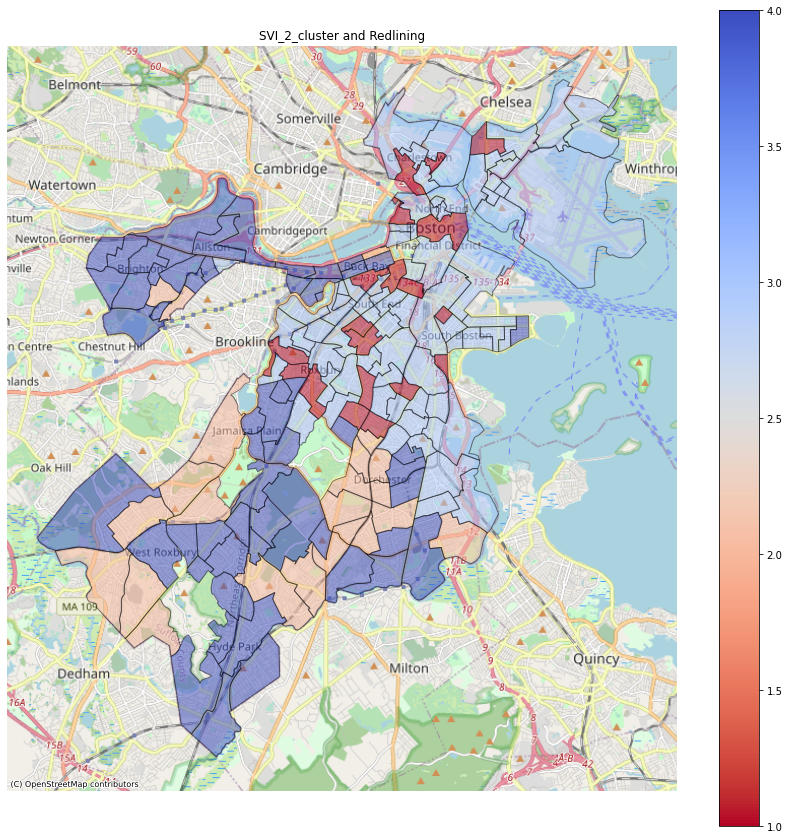

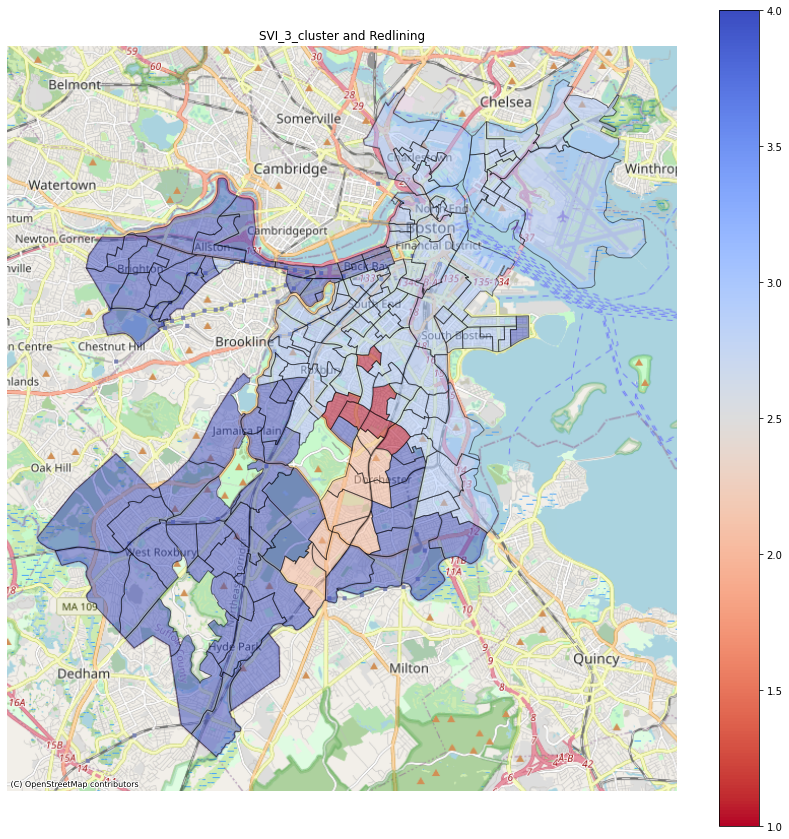

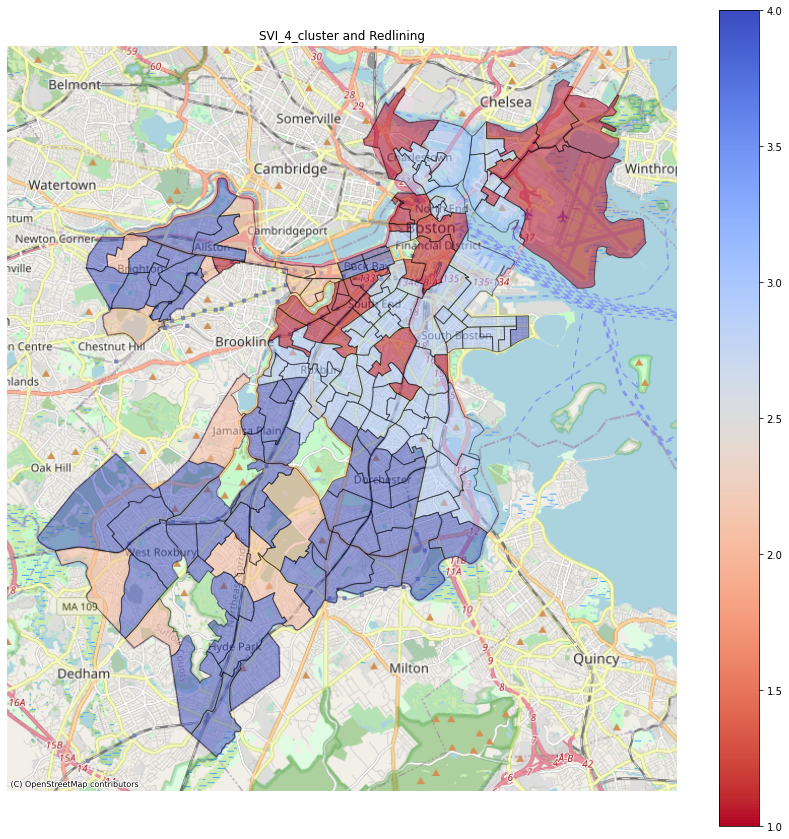

In [ ]:
#1 = (HH), 2 = (HL), 3 = (LH), 4 = (LL) where HH = High SVI, High Redlining, LH = Low SVI, High Redline

import contextily as ctx

cluster_list = ['SVI_cluster','SVI_1_cluster','SVI_2_cluster','SVI_3_cluster','SVI_4_cluster']
for i in cluster_list:
    ax = gdf_Boston.to_crs('EPSG:3857').plot(column=i,figsize=(15, 15), alpha=0.5, edgecolor='k', cmap = "coolwarm_r",legend=True)
    ctx.add_basemap(ax, zoom=12, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_title('{} and Redlining'.format(i))
    ax.set_axis_off()

Moran's I validity for SVI

In [ ]:
import esda
Moran_SVI = esda.Moran_BV(gdf_Boston.SVI,gdf_Boston.redlining_index, w, permutations=1000)
print("Moran's I: {0:.{1}f}".format(Moran_SVI.I, 3))
print("Moran's E[I]: {0:.{1}f}".format(Moran_SVI.EI_sim, 3))
print("Moran's Var[I]: {0:.{1}f}".format(Moran_SVI.VI_sim, 3))

Moran's I: 0.167
Moran's E[I]: -0.002
Moran's Var[I]: 0.002


In [ ]:
round(Moran_SVI.p_z_sim, 3)

0.0

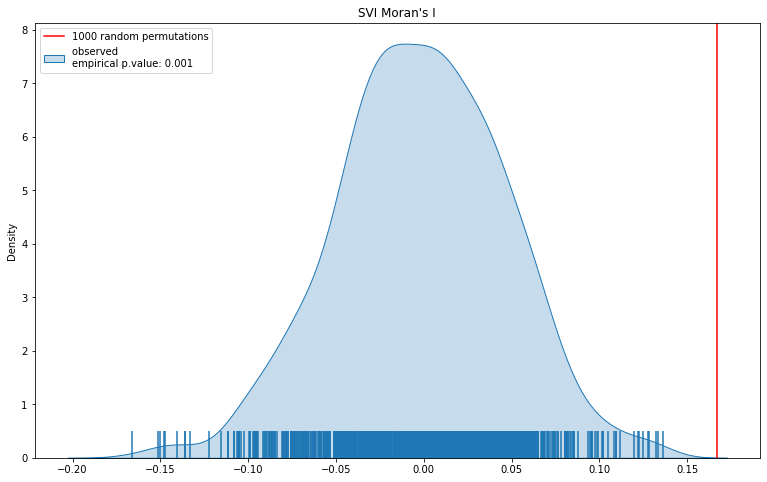

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(13, 8))
sns.kdeplot(Moran_SVI.sim, shade=True, ax=ax)
ax.axvline(Moran_SVI.I, 0, 10, color="r")
ax.set_title("SVI Moran's I")
ax.legend(["1000 random permutations", "observed \nempirical p.value: " + str(round(Moran_SVI.p_sim,3))])
ax.vlines(Moran_SVI.sim, 0, 0.5)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=c9a4f701-31a5-4164-b3f3-c09cddf1309e' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>